In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import copy

import math
import torch
from torch.nn.modules.transformer import TransformerEncoder, TransformerEncoderLayer
from torch.nn.modules import LayerNorm, Linear, ReLU
import torch.nn as nn
import torch.nn.functional as F
import sklearn.metrics
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import pickle
from torch.utils.data import DataLoader

from torch.utils.data import Sampler
import numpy as np
import random
from collections import defaultdict
import csv
import os
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
import torch
from sklearn.metrics import pairwise_distances
from sklearn.neighbors import NearestNeighbors
import numpy as np
import math
from torch.utils.data import Sampler, DataLoader, Dataset
from sklearn.model_selection import StratifiedShuffleSplit



device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Inputs

In [2]:
#shape (Num, Channels, Timesteps)
Input_path = '/kaggle/input/active-learning-subset/tar_image_subset.npy' 
#shape (Num)
Labels_path = '/kaggle/input/active-learning-subset/label_target_subset.npy'

"""
----------------------------------------------------------------------------------------
Loss Function selection
Currently available:
"ce = cross entropy loss","ls = LabelSmoothingCrossEntropyLoss"
"""
loss_mode = "ls"

"""
---------------------------------------------------------------------------------------------
Active Learning Method(s) to use
Currently available:
"random", "entropy", "margin", "least_confident", "diversity", "entropy_diversity", "density"
"""
strategies = [ 'margin', 'least_confident']

"""
----------------------------------------------------------------------------------------
Shape(s) of data to test on:
(Initial samples, Iterations of AL loop, Query Sample Size)
"""
data = [(100,20,10), (300,20,10), (500,20,10)]

batch_size = 20
epochs = 100
test_size = 0.2
lr = 1e-1
weight_decay = 1e-4
label_smoothing = 0.1
ignore_index = -100

In [3]:
#prints how many labeled samples used, and how many samples will hte model effectively be trained on
def eff_total_labeled_samples(init, iterations, query):
    return round(iterations * init + query * (iterations * (iterations - 1)) // 2)

def total_labeled_samples(init, iterations, query):
    return init+query*iterations

print("Samples used: ",[total_labeled_samples(a, b, c) for a, b, c in data])
print("Effective Samples trained on: ",[eff_total_labeled_samples(a, b, c) for a, b, c in data])

Samples used:  [300, 500, 700]
Effective Samples trained on:  [3900, 7900, 11900]


In [4]:
#check if strategy name is correct
for strategy in strategies:
    strategy = strategy.strip().lower()
    allowed_strategies = [
        "entropy", "least_confident", "margin", "random",
        "diversity", "density", "entropy_diversity"
    ]
    
    if strategy not in allowed_strategies:
        raise ValueError(f"[ERROR] Unknown strategy '{strategy}'. Must be one of: {allowed_strategies}")

# Data Loader

In [5]:
def print_distribution(labels, name=""):
    counts = Counter(labels)
    total = sum(counts.values())
    print(f"Distribution in {name}:")
    for label in sorted(counts):
        pct = 100 * counts[label] / total
        print(f"  Class {label}: {counts[label]} ({pct:.1f}%)")


In [6]:
X = np.load(Input_path) 
y = np.load(Labels_path)

X_pool, X_val, y_pool, y_val = train_test_split(X, y, test_size=test_size, stratify=y, random_state=42)

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")
print_distribution(y, name="X")
print(f"X_val shape: {X_val.shape}")
print(f"y_val  shape: {y_val.shape}")
print_distribution(y_val, name="X_val")


X shape: (20000, 6, 28)
y shape: (20000,)
Distribution in X:
  Class 0: 9081 (45.4%)
  Class 1: 2603 (13.0%)
  Class 2: 8316 (41.6%)
X_val shape: (4000, 6, 28)
y_val  shape: (4000,)
Distribution in X_val:
  Class 0: 1816 (45.4%)
  Class 1: 521 (13.0%)
  Class 2: 1663 (41.6%)


In [7]:
class Dataset():
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __getitem__(self, index):
        return {
            "x": self.X[index],  # shape: [C, T]
            "y": self.y[index]
        }

    def __len__(self):
        return len(self.X)

In [8]:
y_sample = y
X_sample = X

# Checking Label distribution
label_counts = Counter(y_sample)
df_labels = pd.DataFrame.from_dict(label_counts, orient='index').sort_index()
df_labels.columns = ['count']
df_labels['percent'] = 100 * df_labels['count'] / len(y_sample)
print("\nLabel distribution:")
print(df_labels)

# Checking normalisation
channel_variance = np.var(X_sample, axis=2).mean(axis=0)
channel_mean = X_sample.mean(axis=(0, 2))
channel_std = X_sample.std(axis=(0, 2))
df_stats = pd.DataFrame({
    'channel': range(6),
    'mean': channel_mean,
    'std_dev': channel_std,
    'variance': channel_variance
})
print("\nMean, Std Dev and Variance per Channel:")
print(df_stats)


Label distribution:
   count  percent
0   9081   45.405
1   2603   13.015
2   8316   41.580

Mean, Std Dev and Variance per Channel:
   channel      mean   std_dev  variance
0        0  0.004546  0.999189  0.730689
1        1  0.004955  0.999538  0.721030
2        2  0.003958  1.000457  0.755685
3        3  0.001807  1.000751  0.783507
4        4  0.001153  1.000271  0.634434
5        5  0.001723  1.000909  0.731176


In [9]:
# Total number of samples
total_samples = sum(label_counts.values())

# Number of classes
num_classes = max(label_counts.keys()) + 1  # assuming labels are integers from 0-n

# Computing weights for each class as inverse frequency
class_weights = []
for i in range(num_classes):
    count = label_counts.get(i, 0)
    if count == 0:
        class_weights.append(1e-6)  # ignoring non-present classes
    else:
        class_weights.append(total_samples / (num_classes * count))

print(class_weights)
# Convert to torch tensor for CE loss function
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)


[0.7341335388907242, 2.5611473940325267, 0.801667468334135]


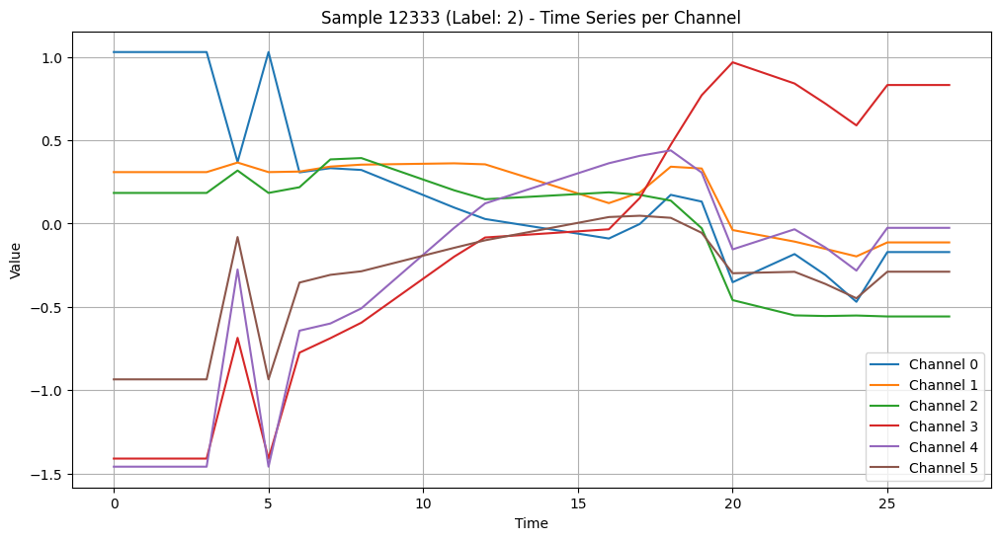

In [10]:
#viewing sample X image channel values per timestep

i = np.random.randint(0, len(X))
sample = X[i]  # Shape: (6, T)

plt.figure(figsize=(12, 6))
for c in range(6):
    plt.plot(sample[c], label=f'Channel {c}')
plt.title(f"Sample {i} (Label: {y[i]}) - Time Series per Channel")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Loss Functions

In [11]:

class Loss:
    def __init__(self, weight=None, ignore_index=-100, device=None, smoothing=0.1):
        self.weight = weight
        self.ignore_index = ignore_index
        self.device = device
        self.smoothing = smoothing
        self.criterion = None
        self.loss_func = None

    def build(self, mode='ce'):
        """
        Available modes: 'ce', 'ls'
        """
        if mode == 'ce':
            self.criterion = nn.CrossEntropyLoss(weight=self.weight, ignore_index=self.ignore_index)
            self.loss_func = self.cross_entropy_loss

        elif mode == 'ls':
            self.loss_func = self.label_smoothing_loss

        else:
            raise NotImplementedError(f"Loss mode '{mode}' is not implemented.")

        if self.device is not None and self.criterion is not None:
            self.criterion = self.criterion.to(self.device)

        return self.loss_func

    def cross_entropy_loss(self, logits, targets):
        return self.criterion(logits, targets)

    def label_smoothing_loss(self, logits, targets):
        log_probs = F.log_softmax(logits, dim=-1)
        
        valid = targets != self.ignore_index
        log_probs = log_probs[valid]
        targets = targets[valid]
        
        nll_loss = -log_probs.gather(dim=-1, index=targets.unsqueeze(1)).squeeze(1)
        smooth_loss = -log_probs.mean(dim=-1)
        loss = (1.0 - self.smoothing) * nll_loss + self.smoothing * smooth_loss
    
        if self.weight is not None:
            weight = self.weight.to(logits.device)
            loss = loss * weight[targets]
    
        return loss.mean()


# Model

In [12]:
################ CNN Backbone 
def conv_block(in_channels: int, out_channels: int, dropout=0.3) -> nn.Module:
    return nn.Sequential(
        nn.Conv1d(in_channels, out_channels, 5, padding='same'),
        nn.BatchNorm1d(out_channels),
        nn.ReLU(),
        nn.Dropout(dropout),
    )

class cnn(nn.Module):
    def __init__(self):
        super(cnn, self).__init__()
        self.conv1 = conv_block(6, 64)
        self.conv2 = conv_block(64, 128)
        self.conv3 = conv_block(128, 256)
        self.conv4 = conv_block(256, 512)
        self.conv5 = conv_block(512, 1024)
        self.global_pool = nn.AdaptiveAvgPool1d(1)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        return x

 
################ Fully connected network
class FC(nn.Module):
    def __init__(self, input_dim):
        super(FC, self).__init__()
        self.dropout = nn.Dropout(0.5)
        self.fco = nn.Linear(input_dim, 3)

    def forward(self, x):
        x = self.dropout(x)
        x = self.fco(x)
        return x



class FullModel(nn.Module):
    def __init__(self, backbone, fc):
        super().__init__()
        self.backbone = backbone
        self.fc = fc

    def forward(self, x):
        feat = self.backbone(x)
        out = self.fc(feat)
        return feat, out

In [13]:
#pretrained weights
map_location=torch.device(device)

backbone = cnn()
fc = FC(1024)

#loading backbone weights
state_dict = torch.load('/kaggle/input/active-learning-subset/backboneSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

backbone.load_state_dict(new_state_dict)

#loading fc weights
state_dict = torch.load('/kaggle/input/active-learning-subset/fcSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

fc.load_state_dict(new_state_dict)

model = FullModel(backbone, fc).to(device)
initial_state_dict = copy.deepcopy(model.state_dict())

# Active Learning methods

In [14]:
def query_samples(model, dataset, query_size, strategy, device, already_selected_idx=None):
    model.eval()

    #check if strategy is correct
    strategy = strategy.strip().lower()
    allowed_strategies = [
        "entropy", "least_confident", "margin", "random",
        "diversity", "density", "entropy_diversity"
    ]
    
    if strategy not in allowed_strategies:
        raise ValueError(f"[ERROR] Unknown strategy '{strategy}'. Must be one of: {allowed_strategies}")

    
    dataloader = DataLoader(dataset, batch_size=128)
    all_scores = []
    all_features = []
    if already_selected_idx is None:
        already_selected_idx = []

    with torch.no_grad():
        for batch in dataloader:
            x = batch["x"].to(device)
            features, out = model(x)
            probs = F.softmax(out, dim=1)

            if strategy in ["entropy", "least_confident", "margin", "random", "entropy_diversity"]:
                score = None
                if strategy in ["entropy", "entropy_diversity"]:
                    score = -torch.sum(probs * torch.log(probs + 1e-10), dim=1)
                elif strategy == "least_confident":
                    score = 1 - probs.max(dim=1)[0]
                elif strategy == "margin":
                    sorted_probs, _ = probs.sort(dim=1, descending=True)
                    score = -(sorted_probs[:, 0] - sorted_probs[:, 1])
                elif strategy == "random":
                    score = torch.rand(len(x), device=device)

                all_scores.extend(score.cpu().numpy())

            if strategy in ["diversity", "density", "entropy_diversity"]:
                all_features.append(features.cpu().numpy())

    if strategy in ["entropy", "least_confident", "margin", "random"]:
        indices = np.argsort(all_scores)[-query_size:]
        return indices

    all_features = np.concatenate(all_features, axis=0)

    if strategy == "diversity":
        # Core-set (k-Center Greedy)
        if already_selected_idx is None or len(already_selected_idx) == 0:
            selected = [np.random.randint(len(all_features))]
        else:
            selected = already_selected_idx.copy()

        selected_features = all_features[selected]
        remaining = list(set(range(len(all_features))) - set(selected))

        for _ in range(query_size):
            dists = pairwise_distances(all_features[remaining], selected_features, metric="euclidean")
            min_dists = np.min(dists, axis=1)
            next_idx = remaining[np.argmax(min_dists)]
            selected.append(next_idx)
            selected_features = np.vstack([selected_features, all_features[next_idx].reshape(1, -1)])
            remaining.remove(next_idx)

        new_indices = list(set(selected) - set(already_selected_idx))[-query_size:]
        return np.array(new_indices)

    elif strategy == "density":
        if all_features.shape[1] > 64:
            from sklearn.decomposition import PCA
            pca = PCA(n_components=64)
            all_features = pca.fit_transform(all_features)

        all_features = all_features.astype(np.float32)
        nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto', metric='euclidean').fit(all_features)
        distances, _ = nbrs.kneighbors(all_features)
        avg_neighbor_dist = distances[:, 1:].mean(axis=1)
        density_scores = -avg_neighbor_dist
        indices = np.argsort(density_scores)[-query_size:]
        return indices

    elif strategy == "entropy_diversity":
        # Hybrid: Select top-2×query_size most uncertain samples, then apply core-set
        all_scores = np.array(all_scores)
        all_features = np.array(all_features)

        top_uncertain_idx = np.argsort(all_scores)[-2 * query_size:]
        uncertain_features = all_features[top_uncertain_idx]

        # Core-set on uncertain samples
        selected = [np.random.randint(len(uncertain_features))]
        selected_features = uncertain_features[selected]
        remaining = list(set(range(len(uncertain_features))) - set(selected))

        for _ in range(query_size - 1):
            dists = pairwise_distances(uncertain_features[remaining], selected_features, metric="euclidean")
            min_dists = np.min(dists, axis=1)
            next_idx = remaining[np.argmax(min_dists)]
            selected.append(next_idx)
            selected_features = np.vstack([selected_features, uncertain_features[next_idx].reshape(1, -1)])
            remaining.remove(next_idx)

        final_indices = top_uncertain_idx[selected]
        return np.array(final_indices)


# Train/eval loop

In [15]:
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    total_loss, all_preds, all_targets = 0, [], []
    
    for batch in dataloader:
        x, y = batch["x"].to(device), batch["y"].to(device)

        optimizer.zero_grad()
        _, out = model(x)
        loss = loss_fn(out, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * len(x)
        preds = torch.argmax(out, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(y.cpu().numpy())

    avg_loss = total_loss / len(dataloader.dataset)
    acc = np.mean(np.array(all_preds) == np.array(all_targets))
    f1s = sklearn.metrics.f1_score(all_targets, all_preds, average=None)
    return avg_loss, acc, f1s, np.mean(f1s)



def _eval_perf(model, dataloader, device, loss_fn=None):
    model.eval()
    pred, gt = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in dataloader:
            x, y = batch["x"].to(device), batch["y"].to(device)
            _, outputs = model(x)
            preds = torch.argmax(outputs, dim=1)
            if loss_fn:
                total_loss += loss_fn(outputs, y).item() * len(x)

            pred.extend(preds.cpu().numpy())
            gt.extend(y.cpu().numpy())

    acc = np.mean(np.array(pred) == np.array(gt))
    f1s = sklearn.metrics.f1_score(gt, pred, average=None)
    avg_f1 = np.mean(f1s)

    if loss_fn:
        avg_loss = total_loss / len(dataloader.dataset)
        return avg_loss, f1s, acc, avg_f1
    else:
        return 0, f1s, acc, avg_f1


In [16]:
def plot_round_metrics(history):
    round_id = len(history["epoch_metrics"]) - 1
    epoch_stats = history["epoch_metrics"][round_id]
    epochs = list(range(1, len(epoch_stats) + 1))

    train_loss = [e["train_loss"] for e in epoch_stats]
    val_loss = [e["val_loss"] for e in epoch_stats]
    train_acc = [e["train_acc"] for e in epoch_stats]
    train_f1 = [e["train_avg_f1"] for e in epoch_stats]
    val_acc = [e["val_acc"] for e in epoch_stats]
    val_f1 = [e["val_avg_f1"] for e in epoch_stats]

    plt.figure(figsize=(15, 4))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss, label="Train Loss")
    plt.plot(epochs, val_loss, label="Val Loss")
    plt.title(f"[Round {round_id+1}] Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_acc, label="Train Acc")
    plt.plot(epochs, val_acc, label="Val Acc")
    plt.title(f"[Round {round_id+1}] Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    # Avg F1 plot
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_f1, label="Train F1")
    plt.plot(epochs, val_f1, label="Val F1")
    plt.title(f"[Round {round_id+1}] Avg F1")
    plt.xlabel("Epoch")
    plt.ylabel("Avg F1")
    plt.legend()

    plt.tight_layout()
    plt.show()



def plot_final_performance(history):
    samples = history["samples"]
    val_acc = history["round_val_acc"]
    val_f1 = history["round_val_avg_f1"]

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(samples, val_acc, marker='o')
    plt.title("Val Accuracy vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(samples, val_f1, marker='o')
    plt.title("Val Avg F1 vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Avg F1")

    plt.tight_layout()
    plt.show()


# Active Learning Loop

In [17]:
def active_learning_loop(model, labeled_dataset, unlabeled_dataset, val_dataset, strategy, device, iters=10, query_size=100, final_epochs=5, loss_mode = 'ce', batch_size = 16):
    
    loss_handler = Loss(weight=class_weights, ignore_index=ignore_index, device=device, smoothing= label_smoothing)
    loss_fn = loss_handler.build(mode=loss_mode) 
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    history = {
        "strategy": strategy,
        "samples": [],
        "epoch_metrics": [],
        "round_val_acc": [],
        "round_val_avg_f1": []
    }

    for it in range(iters):
        print(f"\n[AL Round {it+1}/{iters}] — Labeled samples: {len(labeled_dataset)}")

        train_loader = DataLoader(labeled_dataset, batch_size=batch_size)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)
    
        for i, batch in enumerate(train_loader):
            y_batch = batch["y"]
            print_distribution(y_batch.tolist(), name=f"Batch {i}")


        
        epoch_stats = []

        epochs = final_epochs
        '''        
        if it <= 3:
            epochs = 5
        elif 4 <= it <= 10:
            epochs = 10
        elif 11 <= it:
            epochs = final_epochs
        else:
            epochs = final_epochs
        '''

        
        
        for ep in tqdm(range(epochs), desc="Epoch", leave=False):
            tr_loss, tr_acc, tr_f1s, tr_avgf1 = train_one_epoch(model, train_loader, optimizer, loss_fn, device)
            val_loss, val_f1s, val_acc, val_avgf1 = _eval_perf(model, val_loader, device, loss_fn)

            epoch_stats.append({
                "train_loss": tr_loss,
                "train_acc": tr_acc,
                "train_avg_f1": tr_avgf1,
                "val_loss": val_loss,
                "val_acc": val_acc,
                "val_avg_f1": val_avgf1
            })

        history["samples"].append(len(labeled_dataset))
        history["epoch_metrics"].append(epoch_stats)
        history["round_val_acc"].append(val_acc)
        history["round_val_avg_f1"].append(val_avgf1)

        # Query next samples
        if len(unlabeled_dataset) < query_size:
            print("Unlabeled pool exhausted.")
            break

        selected_idxs = query_samples(model, unlabeled_dataset, query_size, strategy, device)

        new_x = [unlabeled_dataset.X[i] for i in selected_idxs]
        new_y = [unlabeled_dataset.y[i] for i in selected_idxs]

        labeled_dataset.X = torch.cat([labeled_dataset.X, torch.stack(new_x)], dim=0)
        labeled_dataset.y = torch.cat([labeled_dataset.y, torch.tensor(new_y)], dim=0)

        keep_idxs = list(set(range(len(unlabeled_dataset))) - set(selected_idxs))
        unlabeled_dataset.X = torch.stack([unlabeled_dataset.X[i] for i in keep_idxs])
        unlabeled_dataset.y = torch.tensor([unlabeled_dataset.y[i] for i in keep_idxs])

        print(f"\nEpoch {epochs}/{epochs}")
        print(f"Train — Loss: {tr_loss:.4f} | Acc: {tr_acc:.4f} | Avg F1: {tr_avgf1:.4f}")
        print(f"Val   — Loss: {val_loss:.4f} | Acc: {val_acc:.4f} | Avg F1: {val_avgf1:.4f}")

        
        plot_round_metrics(history)

    plot_final_performance(history)
    return history


X_labeled shape: (100, 6, 28)
y_labeled shape: (100,)
Distribution in X_labeled:
  Class 0: 45 (45.0%)
  Class 1: 13 (13.0%)
  Class 2: 42 (42.0%)
X_unlabeled shape: (15900, 6, 28)
y_unlabeled shape: (15900,)
Distribution in X_unlabeled:
  Class 0: 7220 (45.4%)
  Class 1: 2069 (13.0%)
  Class 2: 6611 (41.6%)

=== Running strategy: MARGIN ===

[AL Round 1/20] — Labeled samples: 100
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)



Epoch 100/100
Train — Loss: 0.6801 | Acc: 0.7400 | Avg F1: 0.7791
Val   — Loss: 1.0413 | Acc: 0.5640 | Avg F1: 0.5737


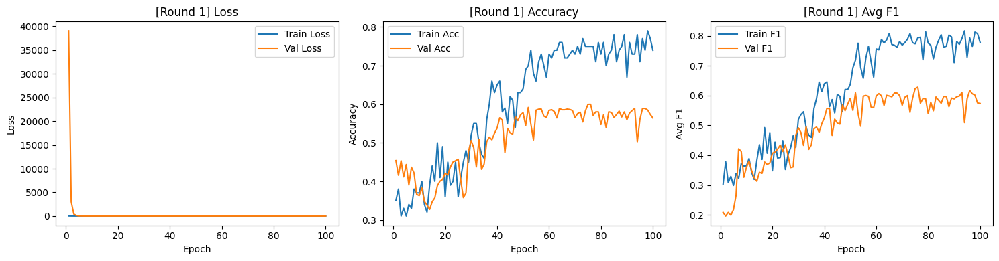


[AL Round 2/20] — Labeled samples: 110
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 2 (20.0%)
  Class 2: 8 (80.0%)



Epoch 100/100
Train — Loss: 0.5696 | Acc: 0.9182 | Avg F1: 0.9174
Val   — Loss: 0.9533 | Acc: 0.7312 | Avg F1: 0.7274


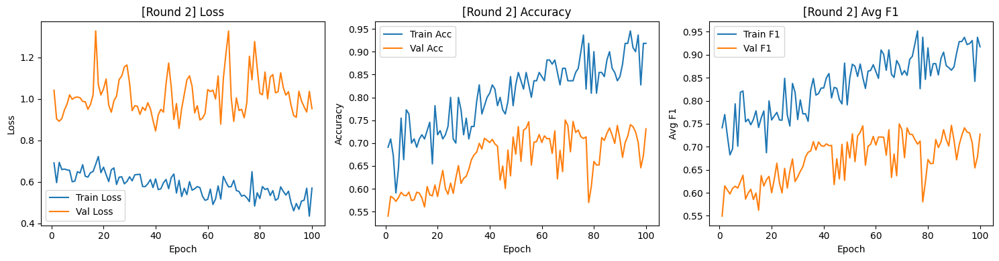


[AL Round 3/20] — Labeled samples: 120
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)



Epoch 100/100
Train — Loss: 0.4128 | Acc: 0.9417 | Avg F1: 0.9463
Val   — Loss: 0.8654 | Acc: 0.7572 | Avg F1: 0.7566


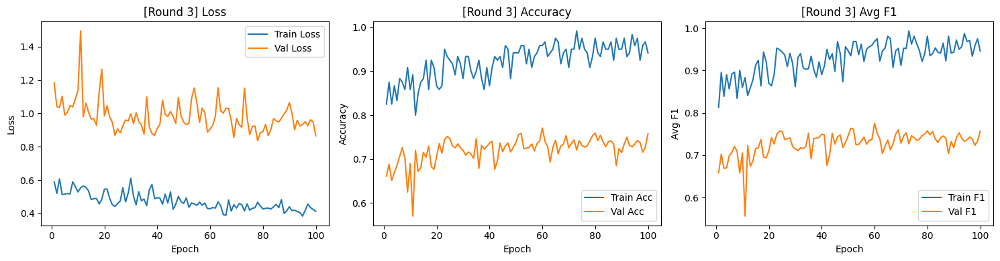


[AL Round 4/20] — Labeled samples: 130
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 6 (60.0%)
  Class 1: 1 (10.0%)
  Class 2: 3 (30.0%)



Epoch 100/100
Train — Loss: 0.3971 | Acc: 0.9769 | Avg F1: 0.9629
Val   — Loss: 0.8473 | Acc: 0.7565 | Avg F1: 0.7596


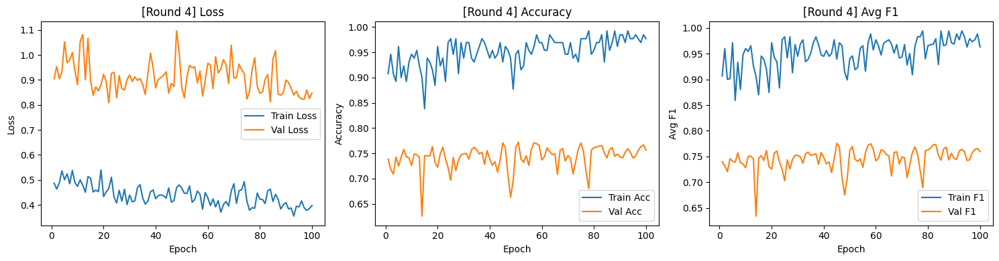


[AL Round 5/20] — Labeled samples: 140
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)



Epoch 100/100
Train — Loss: 0.3569 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.9041 | Acc: 0.7440 | Avg F1: 0.7481


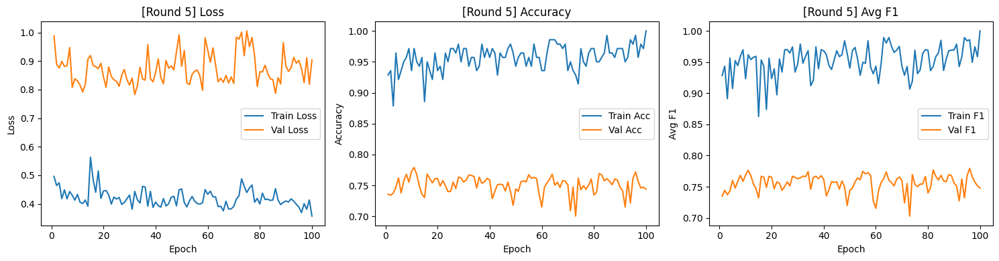


[AL Round 6/20] — Labeled samples: 150
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 2 (20.0%)
  Class 1: 2 (20.0%)
  Class 2: 6 (60.0%)



Epoch 100/100
Train — Loss: 0.4189 | Acc: 0.9600 | Avg F1: 0.9542
Val   — Loss: 0.9081 | Acc: 0.7580 | Avg F1: 0.7638


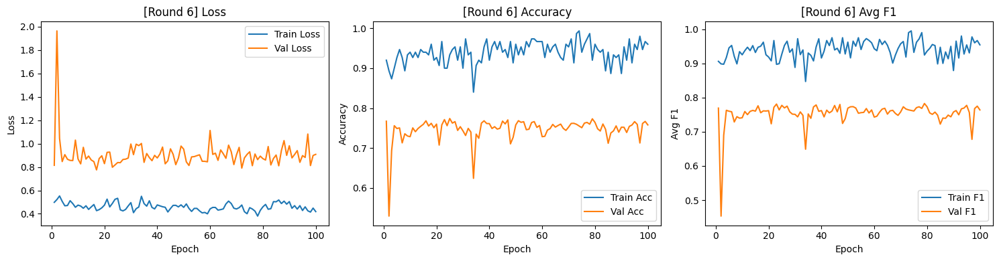


[AL Round 7/20] — Labeled samples: 160
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)



Epoch 100/100
Train — Loss: 0.4000 | Acc: 0.9875 | Avg F1: 0.9907
Val   — Loss: 0.9157 | Acc: 0.7672 | Avg F1: 0.7816


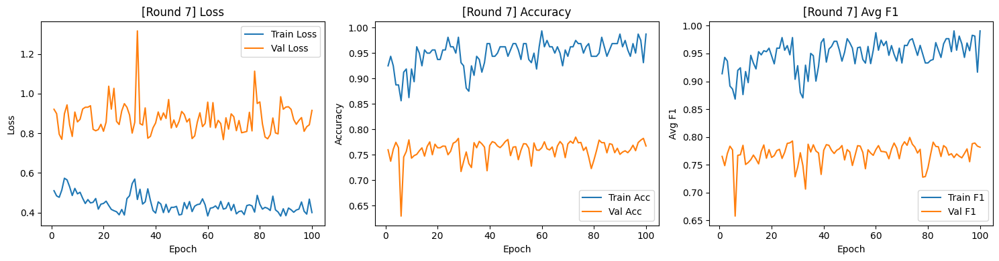


[AL Round 8/20] — Labeled samples: 170
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 4 (40.0%)
  Class 1: 2 (20.0%)
  Class 2: 4 (40.0%)



Epoch 100/100
Train — Loss: 0.4144 | Acc: 0.9706 | Avg F1: 0.9711
Val   — Loss: 0.8218 | Acc: 0.7770 | Avg F1: 0.7832


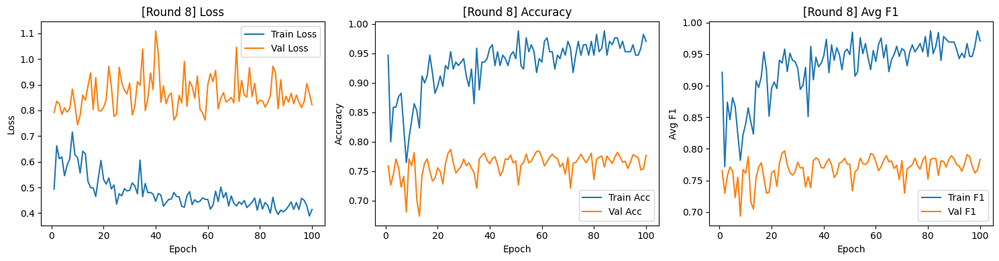


[AL Round 9/20] — Labeled samples: 180
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)



Epoch 100/100
Train — Loss: 0.4370 | Acc: 0.9611 | Avg F1: 0.9471
Val   — Loss: 0.7686 | Acc: 0.7790 | Avg F1: 0.7936


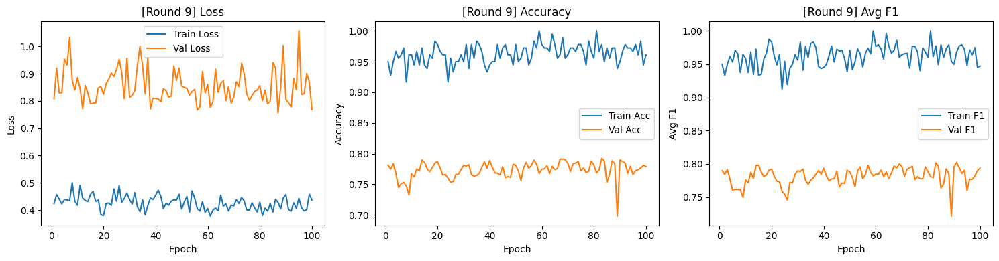


[AL Round 10/20] — Labeled samples: 190
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 7 (70.0%)
  Class 2: 3 (30.0%)



Epoch 100/100
Train — Loss: 0.4128 | Acc: 0.9474 | Avg F1: 0.9543
Val   — Loss: 0.8421 | Acc: 0.7937 | Avg F1: 0.8051


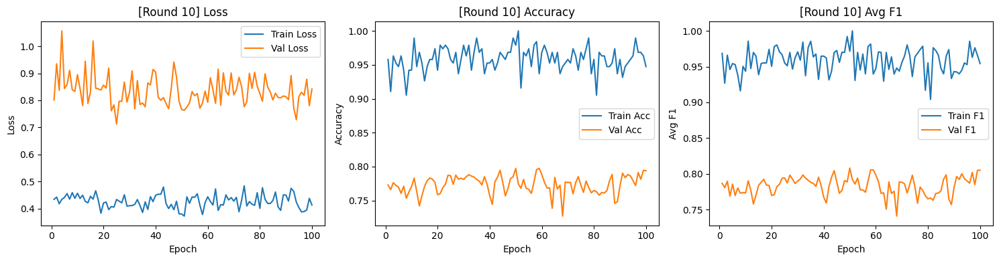


[AL Round 11/20] — Labeled samples: 200
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)



Epoch 100/100
Train — Loss: 0.4258 | Acc: 0.9700 | Avg F1: 0.9648
Val   — Loss: 0.7873 | Acc: 0.7750 | Avg F1: 0.7876


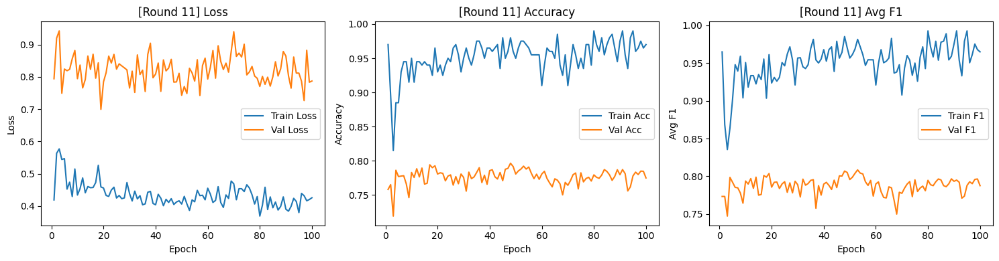


[AL Round 12/20] — Labeled samples: 210
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 3 (30.0%)
  Class 1: 1 (10.0%)
  Class 2: 6 (60.0%)



Epoch 100/100
Train — Loss: 0.3851 | Acc: 0.9714 | Avg F1: 0.9727
Val   — Loss: 0.8213 | Acc: 0.7893 | Avg F1: 0.7965


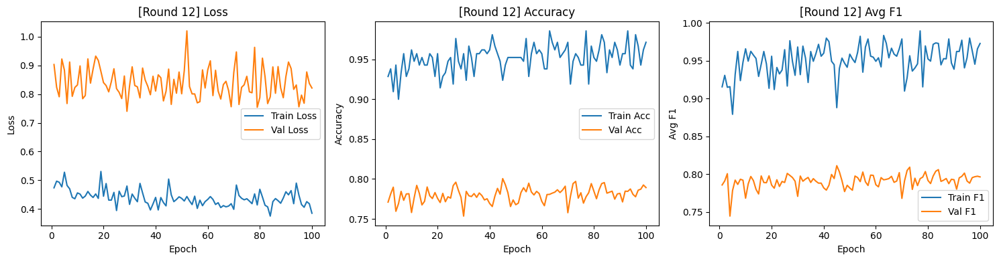


[AL Round 13/20] — Labeled samples: 220
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)



Epoch 100/100
Train — Loss: 0.4531 | Acc: 0.9591 | Avg F1: 0.9447
Val   — Loss: 0.8845 | Acc: 0.7770 | Avg F1: 0.7655


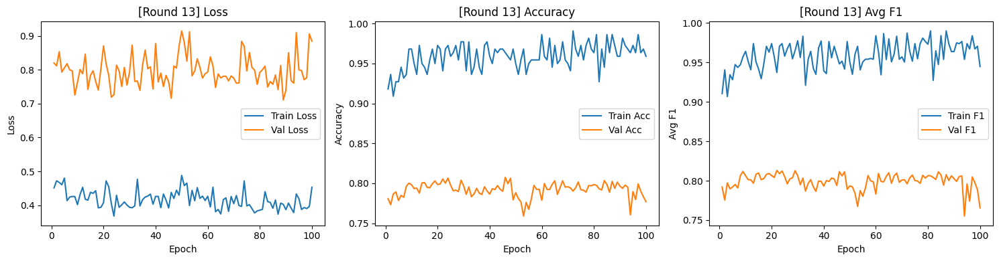


[AL Round 14/20] — Labeled samples: 230
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4010 | Acc: 0.9565 | Avg F1: 0.9560
Val   — Loss: 0.7286 | Acc: 0.8060 | Avg F1: 0.8094


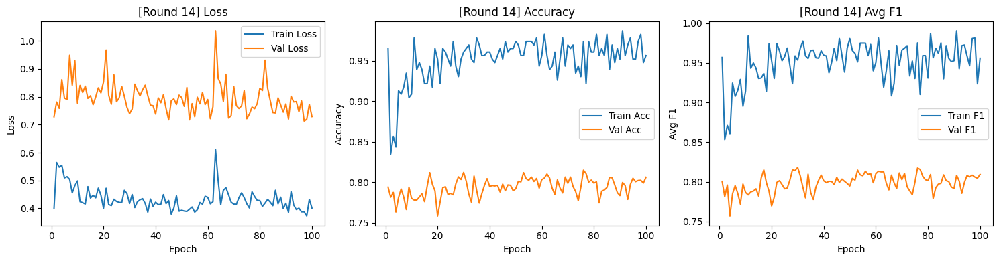


[AL Round 15/20] — Labeled samples: 240
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.3914 | Acc: 0.9625 | Avg F1: 0.9667
Val   — Loss: 0.8232 | Acc: 0.7678 | Avg F1: 0.7742


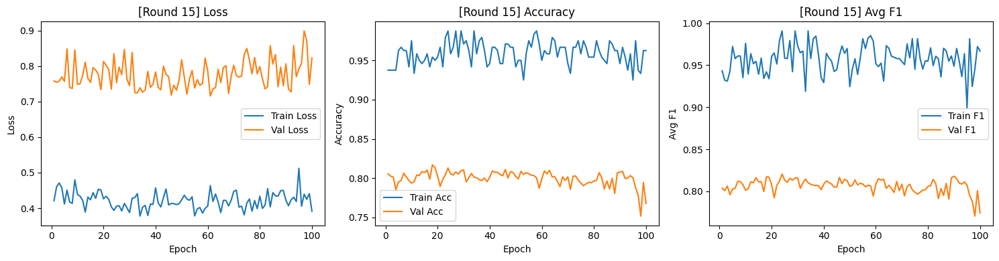


[AL Round 16/20] — Labeled samples: 250
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4458 | Acc: 0.9520 | Avg F1: 0.9486
Val   — Loss: 0.7729 | Acc: 0.7963 | Avg F1: 0.8023


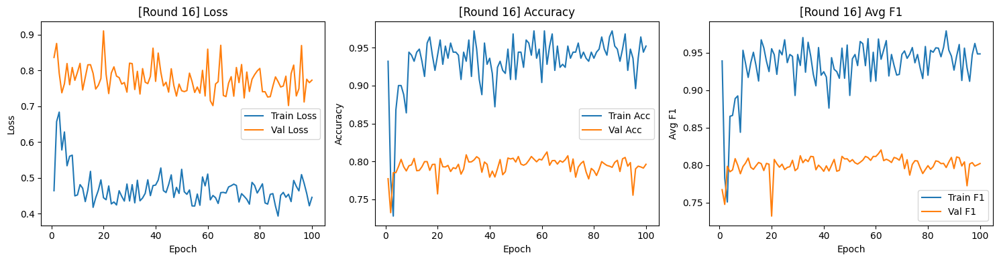


[AL Round 17/20] — Labeled samples: 260
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4564 | Acc: 0.9231 | Avg F1: 0.9165
Val   — Loss: 0.7072 | Acc: 0.8077 | Avg F1: 0.8133


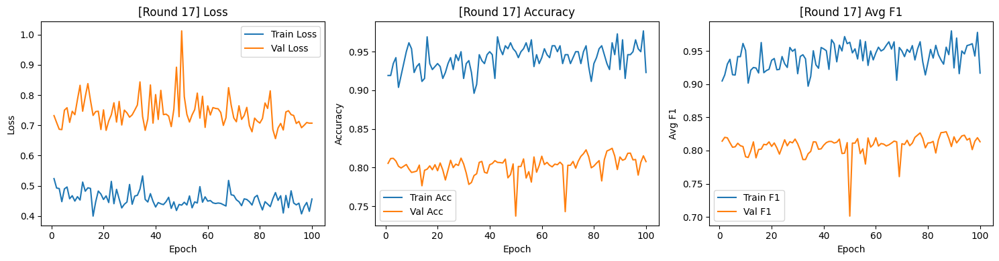


[AL Round 18/20] — Labeled samples: 270
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4451 | Acc: 0.9593 | Avg F1: 0.9649
Val   — Loss: 0.7185 | Acc: 0.8083 | Avg F1: 0.8094


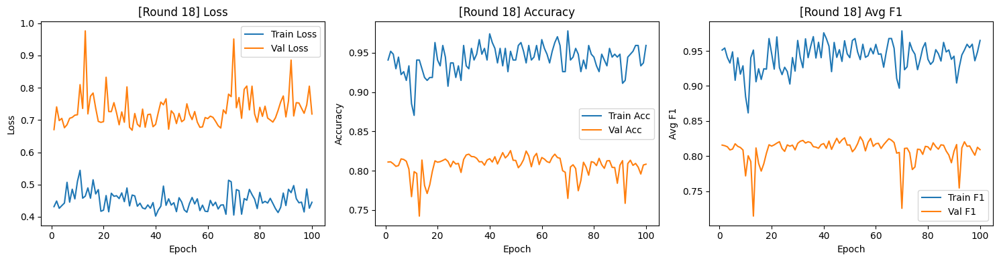


[AL Round 19/20] — Labeled samples: 280
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4641 | Acc: 0.9429 | Avg F1: 0.9330
Val   — Loss: 0.7329 | Acc: 0.8000 | Avg F1: 0.8076


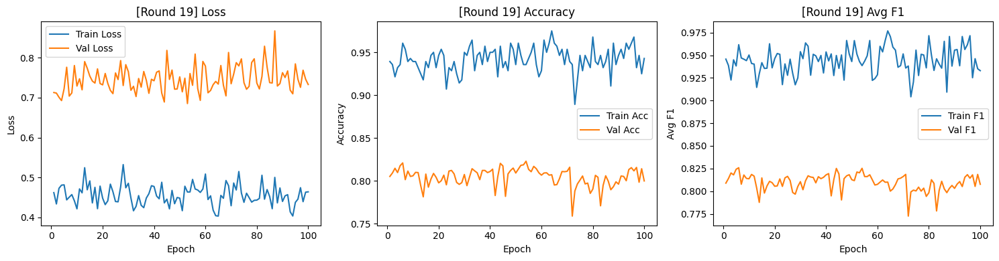


[AL Round 20/20] — Labeled samples: 290
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 2: 15 (75.0%)
Distribution in Batch 6:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 8:
  Class 0: 7 (35.0%)
  Class 1: 3 (15.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 9:
  Class 0: 13 (65.0%)
  Class 1: 1 (5.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distr


Epoch 100/100
Train — Loss: 0.4420 | Acc: 0.9414 | Avg F1: 0.9476
Val   — Loss: 0.7548 | Acc: 0.8103 | Avg F1: 0.8129


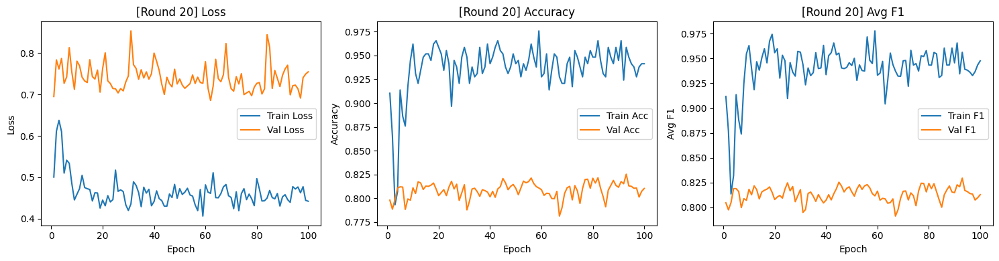

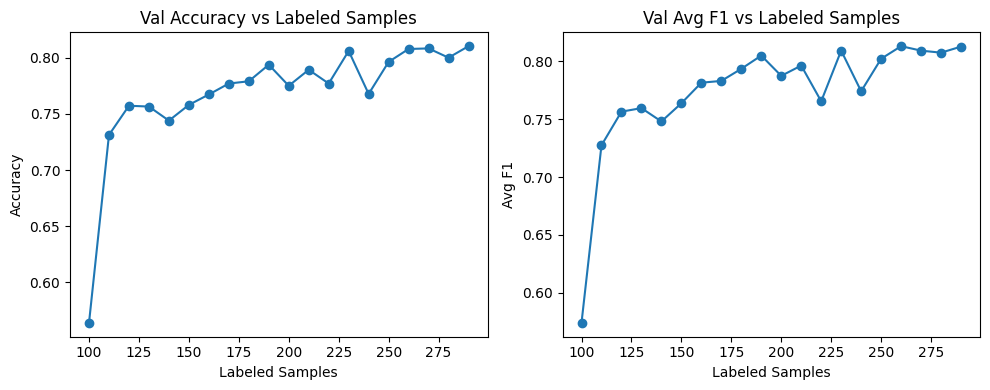


=== Running strategy: LEAST_CONFIDENT ===

[AL Round 1/20] — Labeled samples: 100
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)



Epoch 100/100
Train — Loss: 0.5335 | Acc: 0.8500 | Avg F1: 0.8835
Val   — Loss: 0.8309 | Acc: 0.7270 | Avg F1: 0.7394


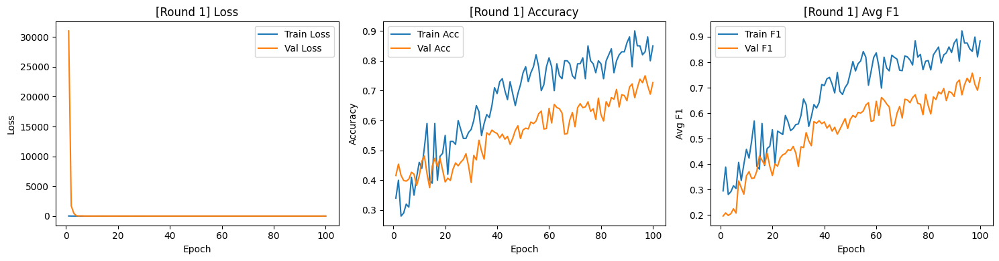


[AL Round 2/20] — Labeled samples: 110
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 3 (30.0%)
  Class 2: 7 (70.0%)



Epoch 100/100
Train — Loss: 0.4413 | Acc: 0.9545 | Avg F1: 0.9559
Val   — Loss: 1.0968 | Acc: 0.7510 | Avg F1: 0.7495


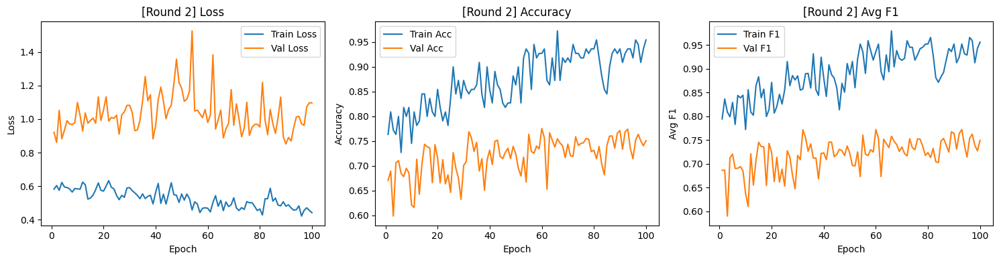


[AL Round 3/20] — Labeled samples: 120
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)



Epoch 100/100
Train — Loss: 0.4178 | Acc: 0.9750 | Avg F1: 0.9720
Val   — Loss: 0.9778 | Acc: 0.7505 | Avg F1: 0.7591


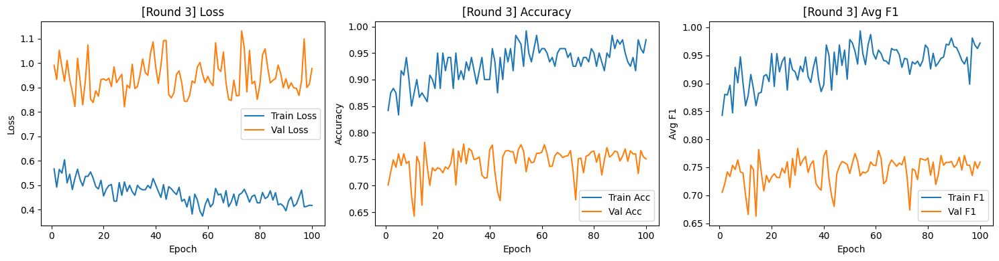


[AL Round 4/20] — Labeled samples: 130
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 7 (70.0%)
  Class 1: 1 (10.0%)
  Class 2: 2 (20.0%)



Epoch 100/100
Train — Loss: 0.4937 | Acc: 0.9308 | Avg F1: 0.9326
Val   — Loss: 1.1536 | Acc: 0.7173 | Avg F1: 0.7051


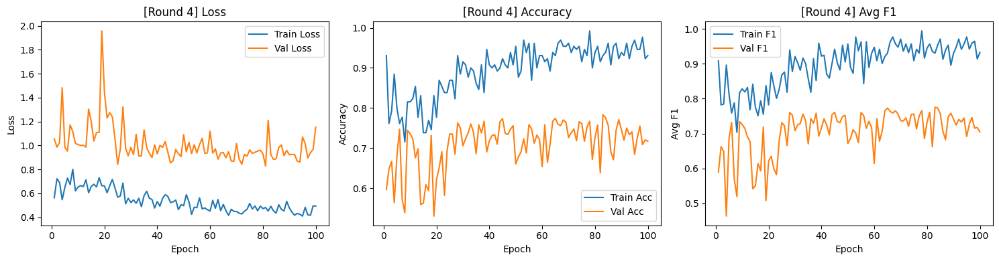


[AL Round 5/20] — Labeled samples: 140
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)



Epoch 100/100
Train — Loss: 0.3917 | Acc: 0.9857 | Avg F1: 0.9892
Val   — Loss: 0.8239 | Acc: 0.7857 | Avg F1: 0.7855


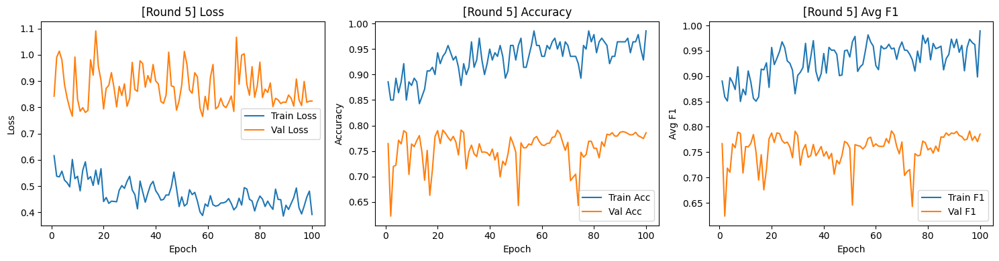


[AL Round 6/20] — Labeled samples: 150
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 5 (50.0%)
  Class 1: 2 (20.0%)
  Class 2: 3 (30.0%)



Epoch 100/100
Train — Loss: 0.4753 | Acc: 0.9400 | Avg F1: 0.9472
Val   — Loss: 1.0093 | Acc: 0.7725 | Avg F1: 0.7652


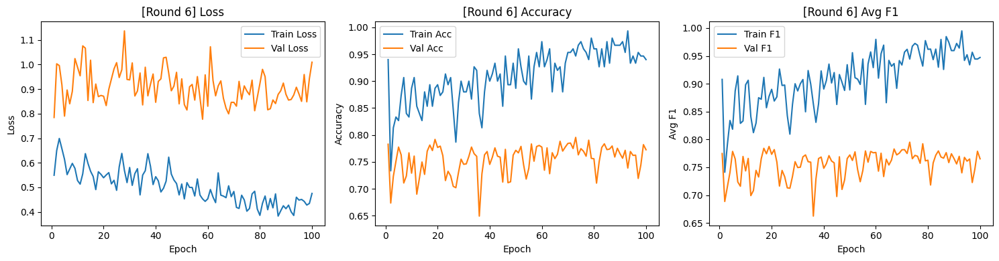


[AL Round 7/20] — Labeled samples: 160
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)



Epoch 100/100
Train — Loss: 0.4236 | Acc: 0.9750 | Avg F1: 0.9668
Val   — Loss: 0.8878 | Acc: 0.7630 | Avg F1: 0.7646


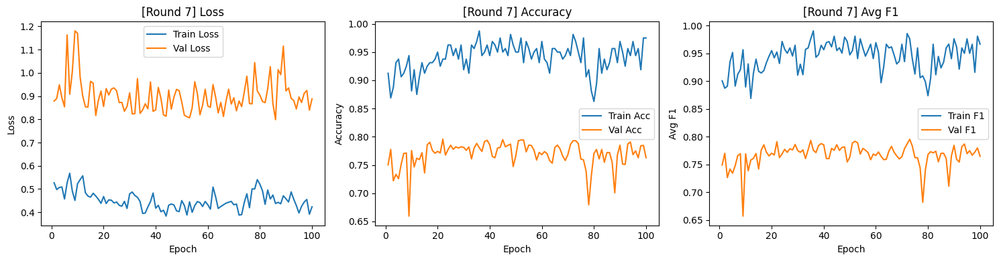


[AL Round 8/20] — Labeled samples: 170
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 1 (10.0%)
  Class 1: 6 (60.0%)
  Class 2: 3 (30.0%)



Epoch 100/100
Train — Loss: 0.4176 | Acc: 0.9765 | Avg F1: 0.9770
Val   — Loss: 0.8622 | Acc: 0.7712 | Avg F1: 0.7861


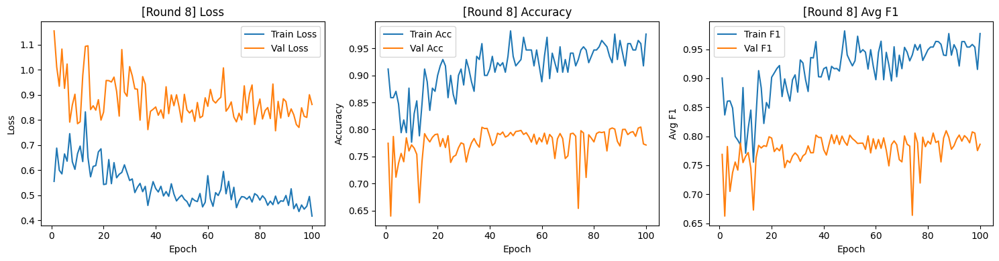


[AL Round 9/20] — Labeled samples: 180
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)



Epoch 100/100
Train — Loss: 0.5122 | Acc: 0.9333 | Avg F1: 0.9309
Val   — Loss: 0.9019 | Acc: 0.7847 | Avg F1: 0.7852


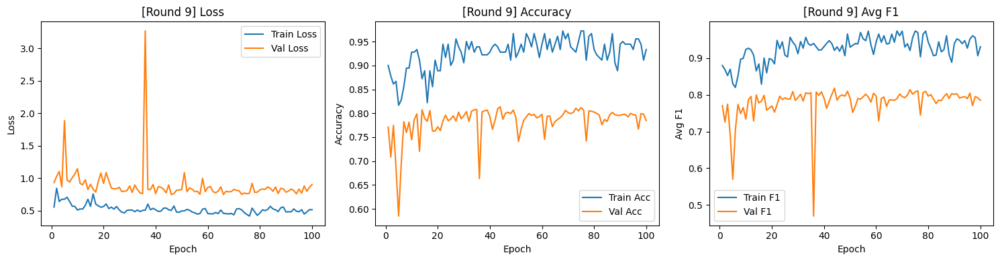


[AL Round 10/20] — Labeled samples: 190
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 7 (70.0%)
  Class 1: 1 (10.0%)
  Class 2: 2 (20.0%)



Epoch 100/100
Train — Loss: 0.5062 | Acc: 0.9474 | Avg F1: 0.9413
Val   — Loss: 0.8074 | Acc: 0.7735 | Avg F1: 0.7822


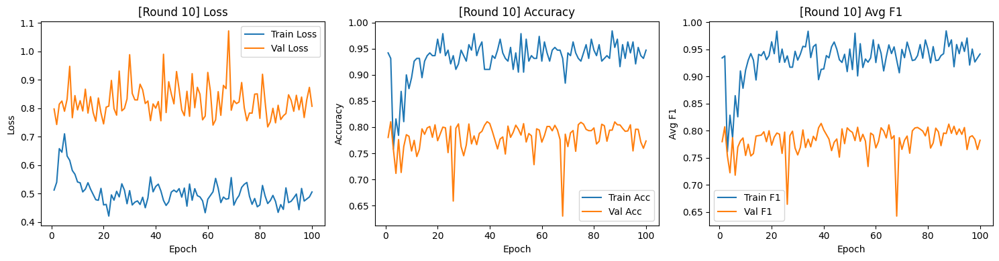


[AL Round 11/20] — Labeled samples: 200
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)



Epoch 100/100
Train — Loss: 0.4877 | Acc: 0.9600 | Avg F1: 0.9609
Val   — Loss: 0.8153 | Acc: 0.7853 | Avg F1: 0.7815


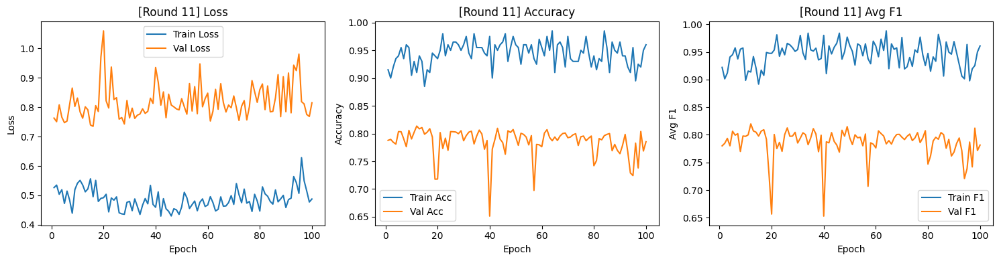


[AL Round 12/20] — Labeled samples: 210
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 3 (30.0%)
  Class 1: 3 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5006 | Acc: 0.9571 | Avg F1: 0.9573
Val   — Loss: 0.7988 | Acc: 0.7955 | Avg F1: 0.8051


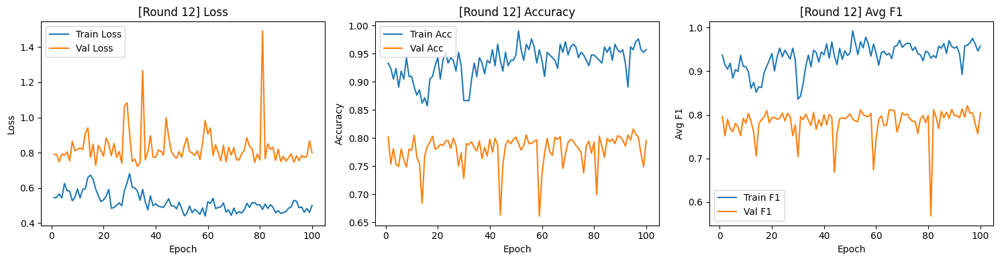


[AL Round 13/20] — Labeled samples: 220
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5168 | Acc: 0.9591 | Avg F1: 0.9533
Val   — Loss: 0.8017 | Acc: 0.8023 | Avg F1: 0.7974


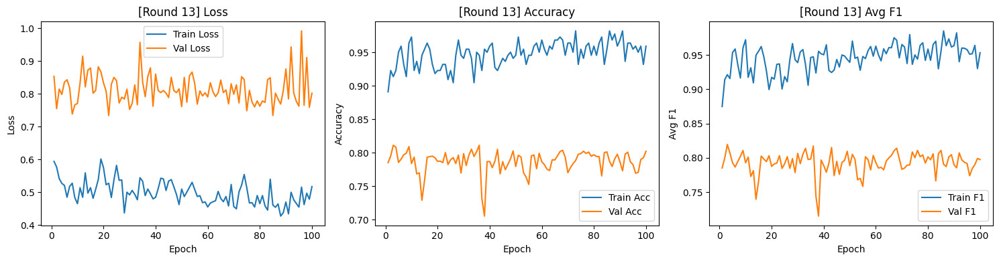


[AL Round 14/20] — Labeled samples: 230
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4877 | Acc: 0.9565 | Avg F1: 0.9543
Val   — Loss: 0.8341 | Acc: 0.7880 | Avg F1: 0.7972


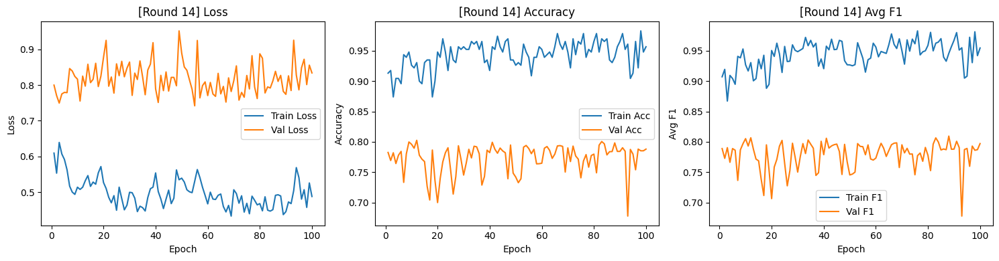


[AL Round 15/20] — Labeled samples: 240
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4728 | Acc: 0.9667 | Avg F1: 0.9656
Val   — Loss: 0.7759 | Acc: 0.7957 | Avg F1: 0.7919


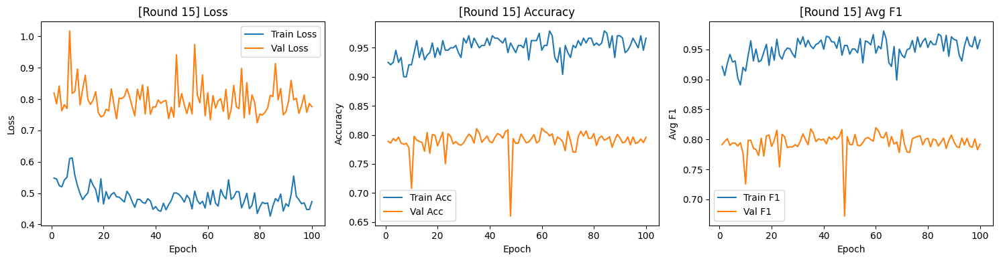


[AL Round 16/20] — Labeled samples: 250
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4481 | Acc: 0.9640 | Avg F1: 0.9613
Val   — Loss: 0.7498 | Acc: 0.8110 | Avg F1: 0.8169


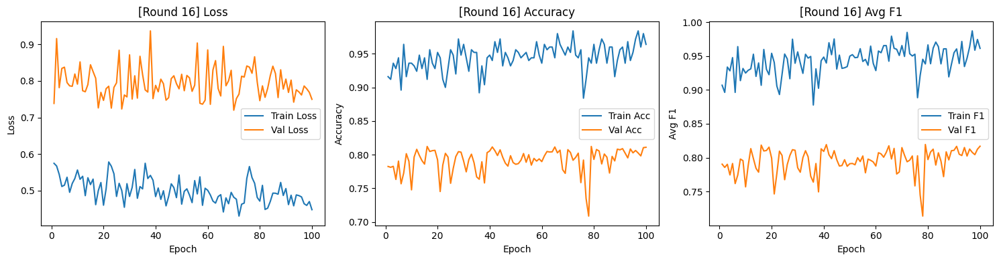


[AL Round 17/20] — Labeled samples: 260
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5223 | Acc: 0.9346 | Avg F1: 0.9262
Val   — Loss: 0.8217 | Acc: 0.8100 | Avg F1: 0.8099


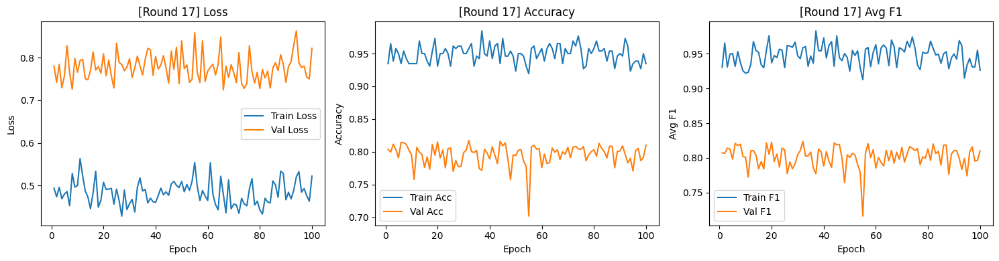


[AL Round 18/20] — Labeled samples: 270
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4601 | Acc: 0.9519 | Avg F1: 0.9540
Val   — Loss: 0.7947 | Acc: 0.7865 | Avg F1: 0.7929


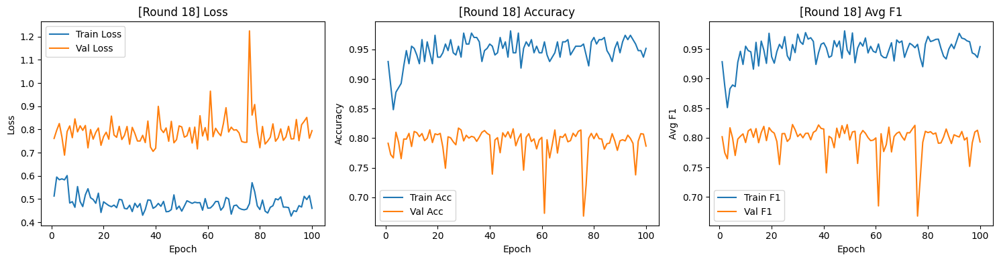


[AL Round 19/20] — Labeled samples: 280
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4302 | Acc: 0.9929 | Avg F1: 0.9920
Val   — Loss: 0.7334 | Acc: 0.8047 | Avg F1: 0.8080


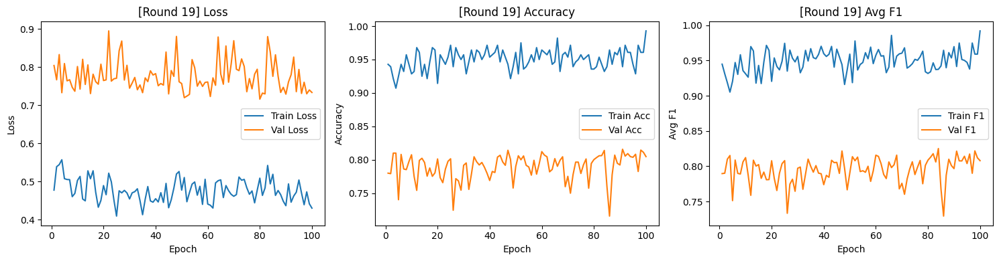


[AL Round 20/20] — Labeled samples: 290
Distribution in Batch 0:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 1:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 2:
  Class 0: 4 (20.0%)
  Class 1: 4 (20.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 3:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 4:
  Class 0: 12 (60.0%)
  Class 1: 3 (15.0%)
  Class 2: 5 (25.0%)
Distribution in Batch 5:
  Class 0: 7 (35.0%)
  Class 1: 1 (5.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 6:
  Class 0: 16 (80.0%)
  Class 1: 1 (5.0%)
  Class 2: 3 (15.0%)
Distribution in Batch 7:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 8:
  Class 0: 3 (15.0%)
  Class 1: 9 (45.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 9:
  Class 0: 14 (70.0%)
  Class 1: 4 (20.0%)
  Class 2: 2 (10.0%)
Distribution in Batch 10:
  Class 0: 7 (35.0%)
  Class 1: 6 (30.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5009 | Acc: 0.9379 | Avg F1: 0.9368
Val   — Loss: 0.7890 | Acc: 0.8127 | Avg F1: 0.8154


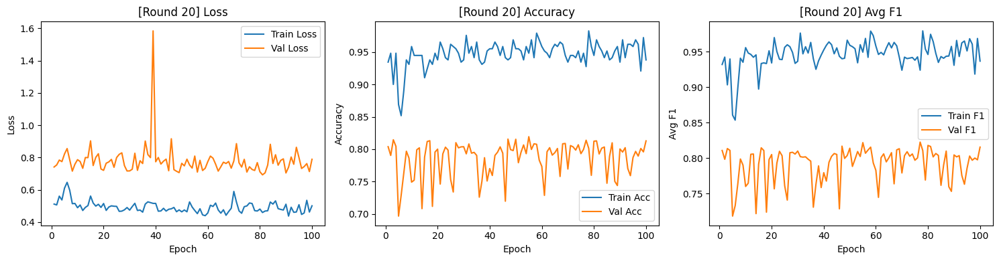

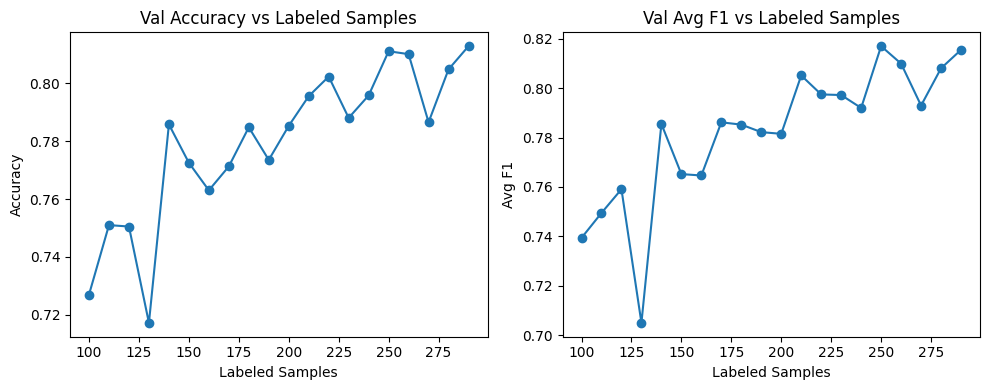

X_labeled shape: (300, 6, 28)
y_labeled shape: (300,)
Distribution in X_labeled:
  Class 0: 136 (45.3%)
  Class 1: 39 (13.0%)
  Class 2: 125 (41.7%)
X_unlabeled shape: (15700, 6, 28)
y_unlabeled shape: (15700,)
Distribution in X_unlabeled:
  Class 0: 7129 (45.4%)
  Class 1: 2043 (13.0%)
  Class 2: 6528 (41.6%)

=== Running strategy: MARGIN ===

[AL Round 1/20] — Labeled samples: 300
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (3


Epoch 100/100
Train — Loss: 0.6854 | Acc: 0.7133 | Avg F1: 0.7211
Val   — Loss: 0.7730 | Acc: 0.7628 | Avg F1: 0.7501


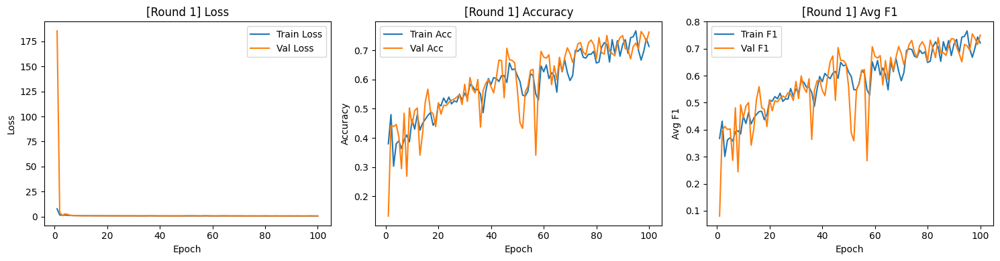


[AL Round 2/20] — Labeled samples: 310
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.8007 | Acc: 0.6710 | Avg F1: 0.6631
Val   — Loss: 0.7155 | Acc: 0.7855 | Avg F1: 0.7798


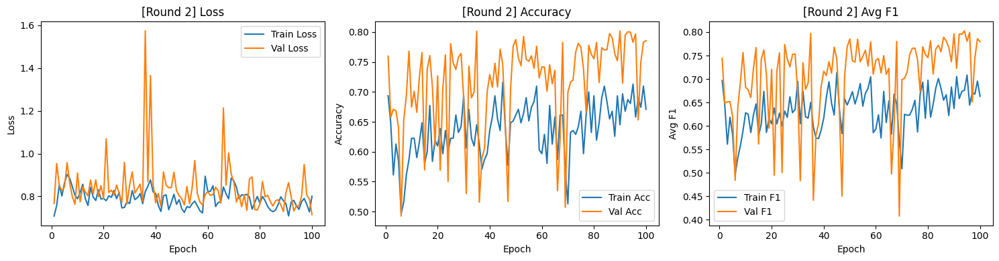


[AL Round 3/20] — Labeled samples: 320
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.6220 | Acc: 0.8000 | Avg F1: 0.7777
Val   — Loss: 0.6436 | Acc: 0.8440 | Avg F1: 0.8422


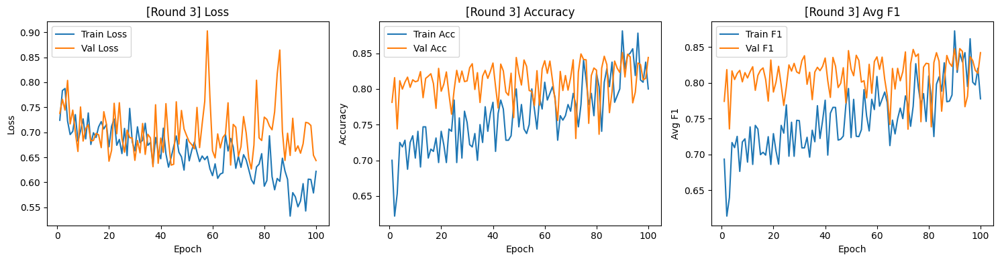


[AL Round 4/20] — Labeled samples: 330
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5068 | Acc: 0.8909 | Avg F1: 0.8692
Val   — Loss: 0.7067 | Acc: 0.8257 | Avg F1: 0.8261


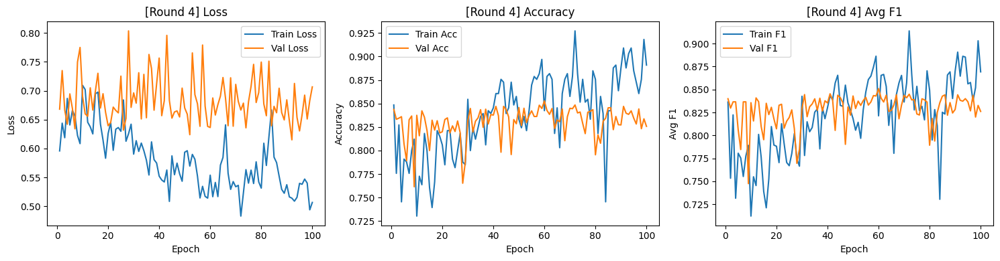


[AL Round 5/20] — Labeled samples: 340
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.6274 | Acc: 0.8235 | Avg F1: 0.8020
Val   — Loss: 0.6535 | Acc: 0.8203 | Avg F1: 0.8092


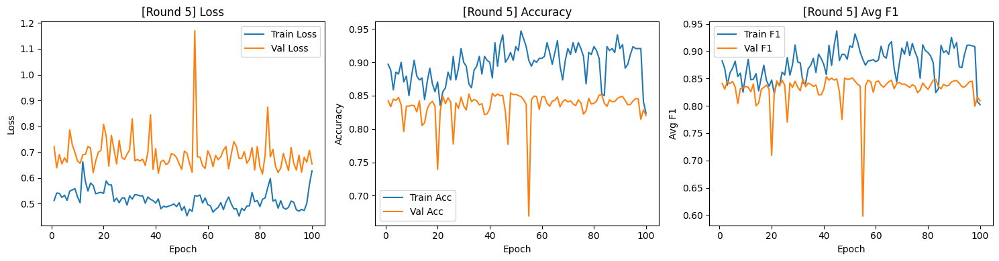


[AL Round 6/20] — Labeled samples: 350
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4484 | Acc: 0.9400 | Avg F1: 0.9461
Val   — Loss: 0.6552 | Acc: 0.8423 | Avg F1: 0.8425


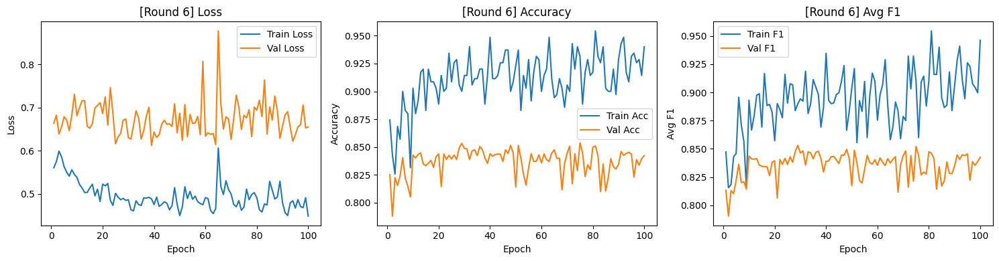


[AL Round 7/20] — Labeled samples: 360
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4261 | Acc: 0.9722 | Avg F1: 0.9683
Val   — Loss: 0.6201 | Acc: 0.8435 | Avg F1: 0.8433


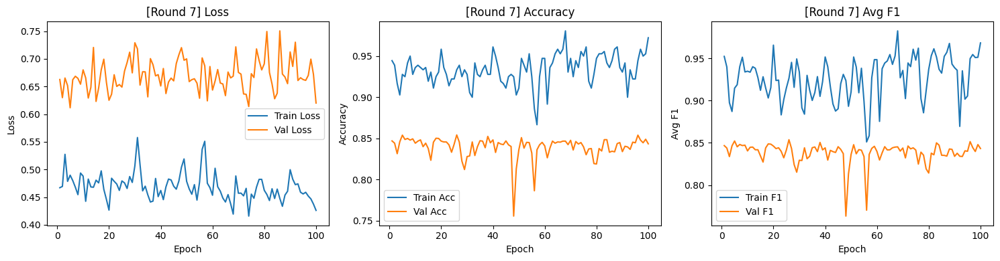


[AL Round 8/20] — Labeled samples: 370
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4675 | Acc: 0.9486 | Avg F1: 0.9274
Val   — Loss: 0.6734 | Acc: 0.8280 | Avg F1: 0.8304


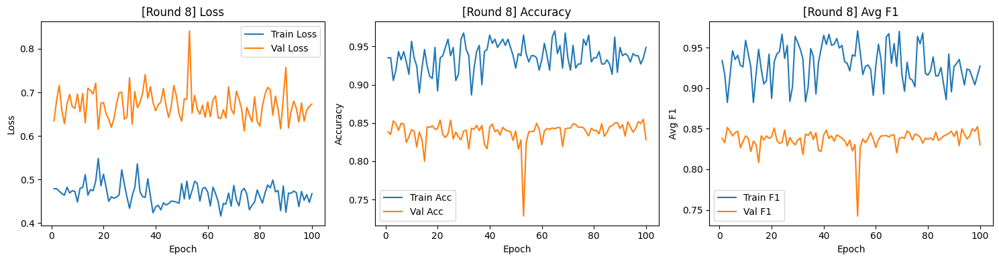


[AL Round 9/20] — Labeled samples: 380
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.4358 | Acc: 0.9526 | Avg F1: 0.9536
Val   — Loss: 0.6463 | Acc: 0.8425 | Avg F1: 0.8417


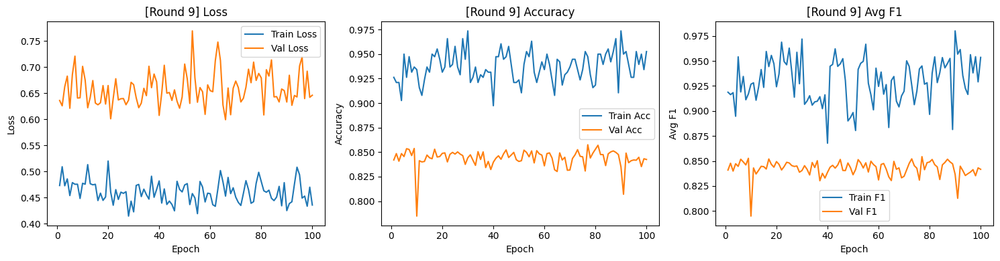


[AL Round 10/20] — Labeled samples: 390
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4114 | Acc: 0.9692 | Avg F1: 0.9714
Val   — Loss: 0.6356 | Acc: 0.8450 | Avg F1: 0.8433


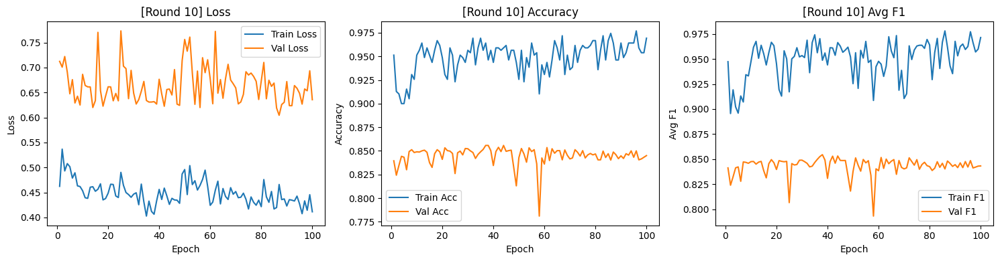


[AL Round 11/20] — Labeled samples: 400
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4219 | Acc: 0.9700 | Avg F1: 0.9648
Val   — Loss: 0.6454 | Acc: 0.8440 | Avg F1: 0.8415


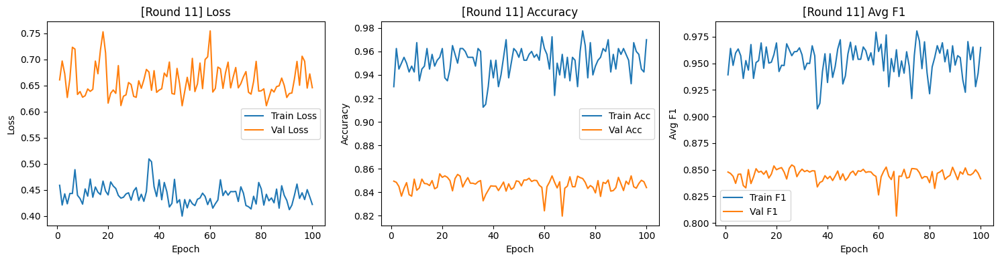


[AL Round 12/20] — Labeled samples: 410
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4285 | Acc: 0.9585 | Avg F1: 0.9552
Val   — Loss: 0.6198 | Acc: 0.8370 | Avg F1: 0.8366


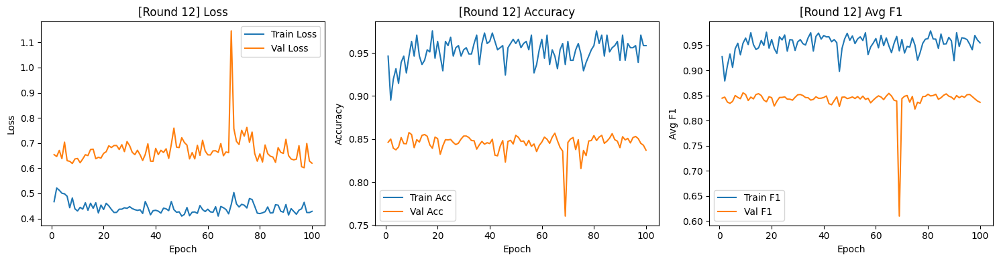


[AL Round 13/20] — Labeled samples: 420
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4564 | Acc: 0.9286 | Avg F1: 0.9065
Val   — Loss: 0.5996 | Acc: 0.8458 | Avg F1: 0.8440


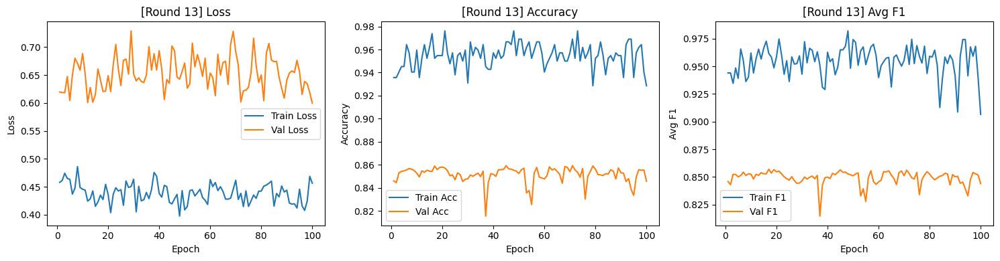


[AL Round 14/20] — Labeled samples: 430
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4676 | Acc: 0.9302 | Avg F1: 0.9186
Val   — Loss: 0.6256 | Acc: 0.8448 | Avg F1: 0.8389


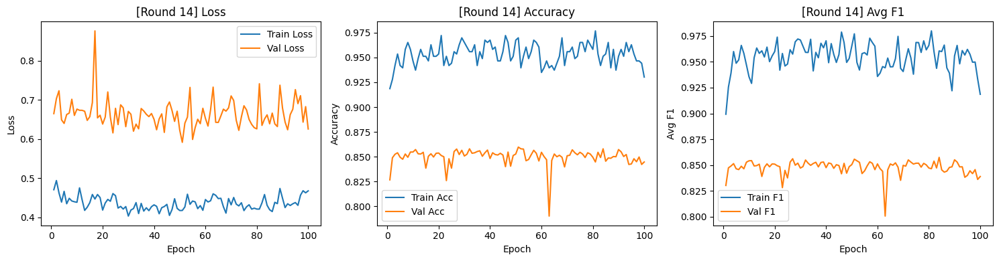


[AL Round 15/20] — Labeled samples: 440
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4465 | Acc: 0.9568 | Avg F1: 0.9472
Val   — Loss: 0.6862 | Acc: 0.8528 | Avg F1: 0.8492


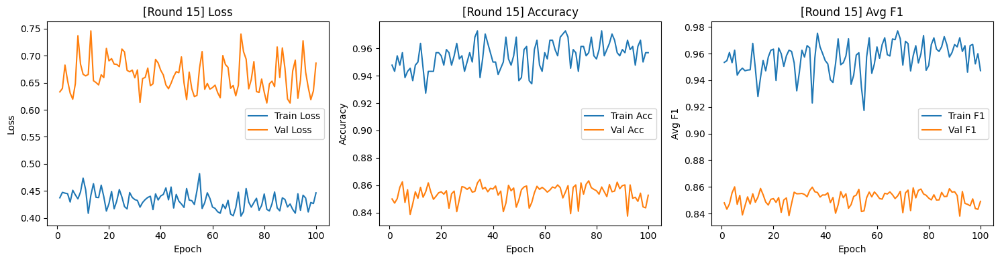


[AL Round 16/20] — Labeled samples: 450
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4138 | Acc: 0.9556 | Avg F1: 0.9617
Val   — Loss: 0.6212 | Acc: 0.8612 | Avg F1: 0.8569


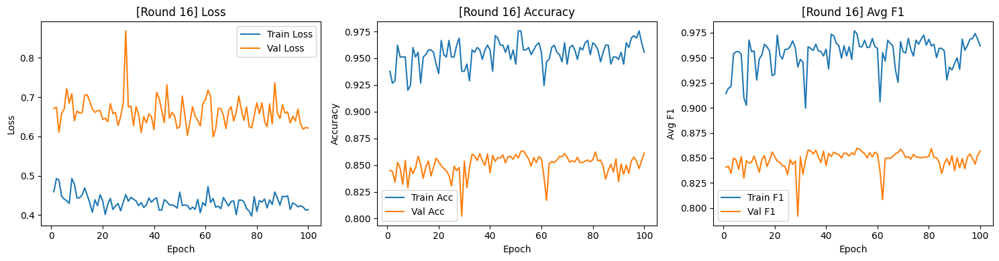


[AL Round 17/20] — Labeled samples: 460
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4217 | Acc: 0.9609 | Avg F1: 0.9633
Val   — Loss: 0.6464 | Acc: 0.8383 | Avg F1: 0.8378


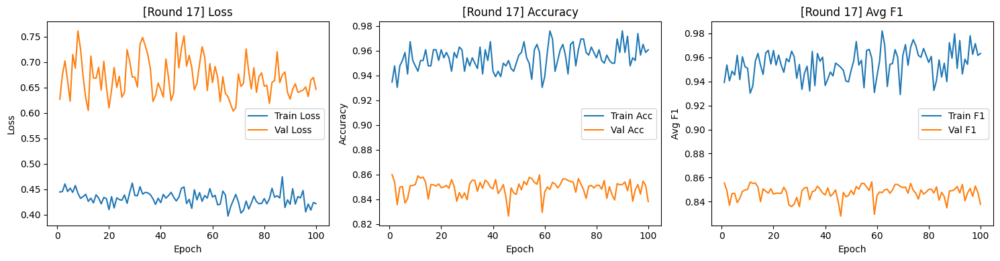


[AL Round 18/20] — Labeled samples: 470
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4635 | Acc: 0.9426 | Avg F1: 0.9419
Val   — Loss: 0.6729 | Acc: 0.8572 | Avg F1: 0.8548


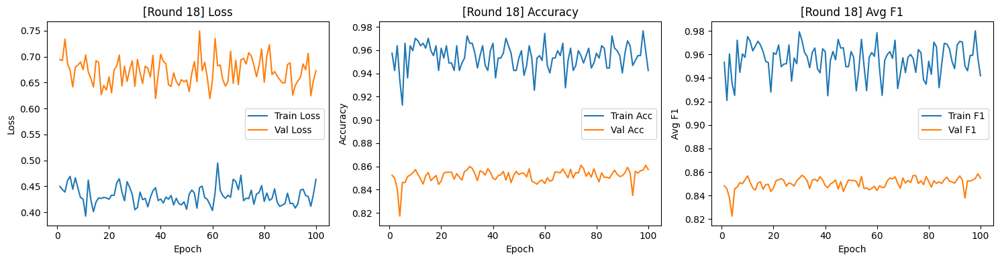


[AL Round 19/20] — Labeled samples: 480
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4224 | Acc: 0.9646 | Avg F1: 0.9711
Val   — Loss: 0.6246 | Acc: 0.8532 | Avg F1: 0.8520


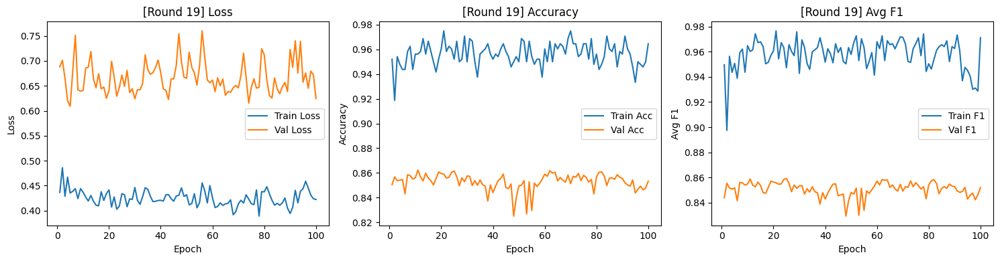


[AL Round 20/20] — Labeled samples: 490
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.4222 | Acc: 0.9571 | Avg F1: 0.9583
Val   — Loss: 0.6435 | Acc: 0.8500 | Avg F1: 0.8482


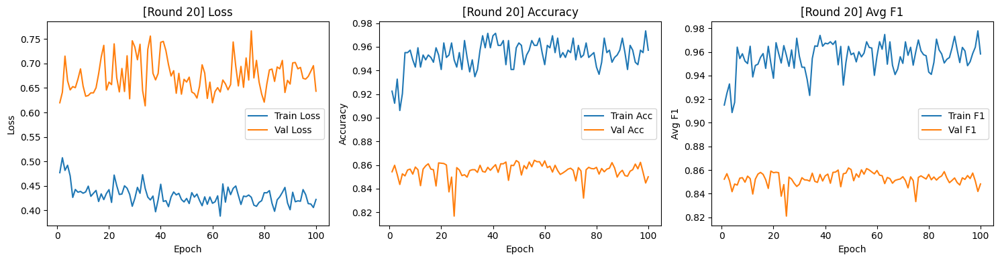

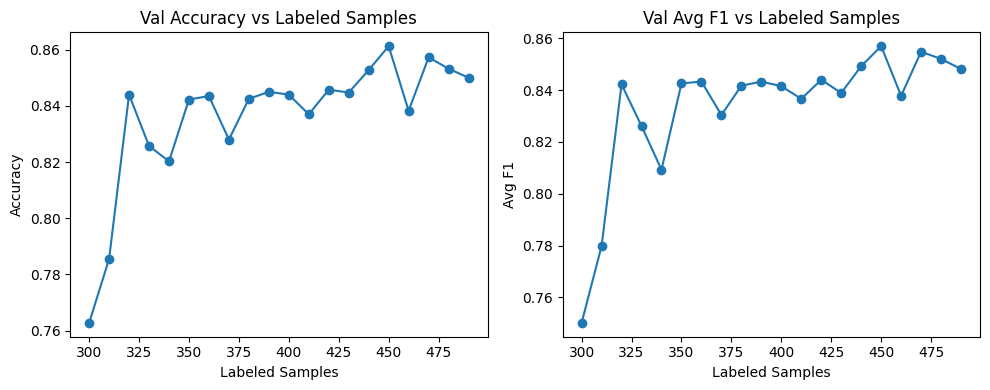


=== Running strategy: LEAST_CONFIDENT ===

[AL Round 1/20] — Labeled samples: 300
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Clas


Epoch 100/100
Train — Loss: 0.6531 | Acc: 0.7767 | Avg F1: 0.7741
Val   — Loss: 0.6701 | Acc: 0.8077 | Avg F1: 0.8025


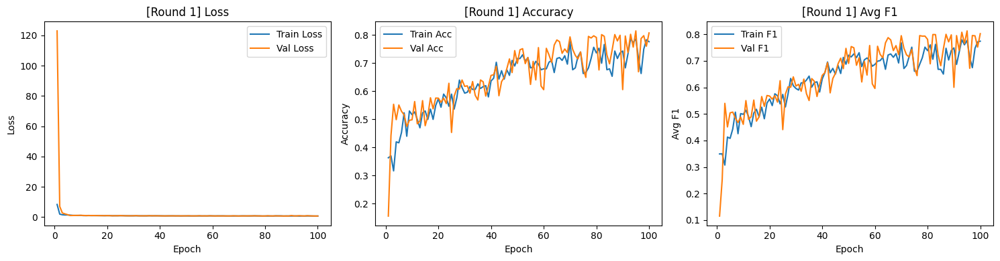


[AL Round 2/20] — Labeled samples: 310
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.6171 | Acc: 0.8065 | Avg F1: 0.7889
Val   — Loss: 0.7026 | Acc: 0.8160 | Avg F1: 0.8108


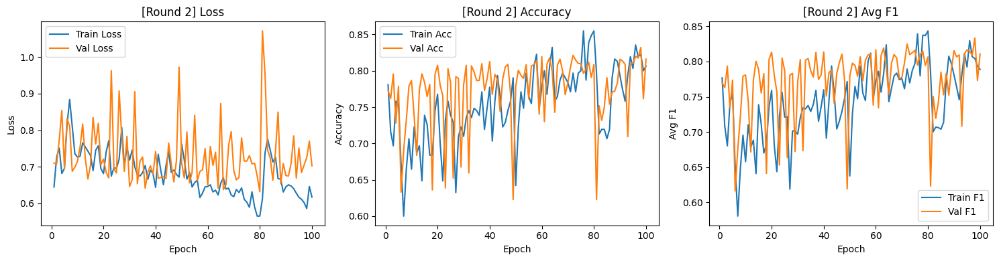


[AL Round 3/20] — Labeled samples: 320
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.6086 | Acc: 0.8469 | Avg F1: 0.8295
Val   — Loss: 0.8220 | Acc: 0.8283 | Avg F1: 0.8202


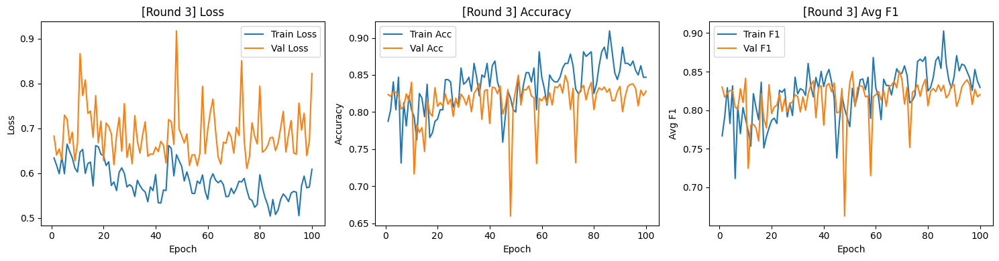


[AL Round 4/20] — Labeled samples: 330
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.6018 | Acc: 0.8606 | Avg F1: 0.8678
Val   — Loss: 0.7755 | Acc: 0.7738 | Avg F1: 0.7790


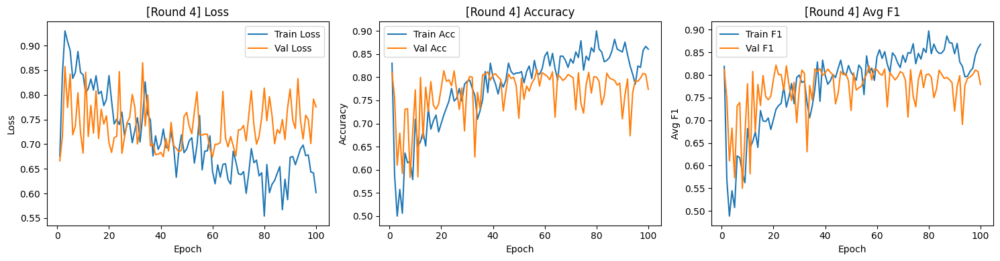


[AL Round 5/20] — Labeled samples: 340
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5216 | Acc: 0.9147 | Avg F1: 0.9286
Val   — Loss: 0.7456 | Acc: 0.7840 | Avg F1: 0.7889


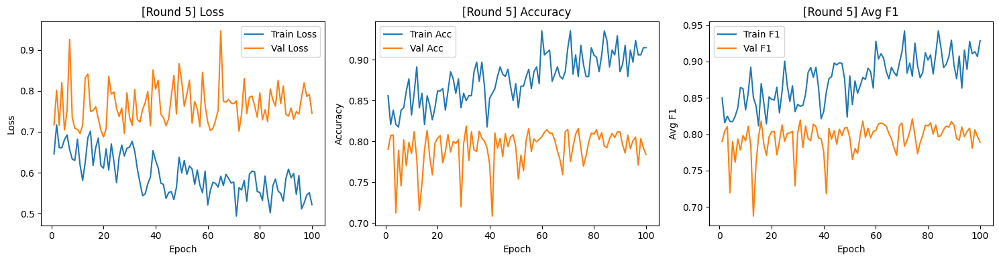


[AL Round 6/20] — Labeled samples: 350
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5882 | Acc: 0.9000 | Avg F1: 0.9060
Val   — Loss: 0.7264 | Acc: 0.8080 | Avg F1: 0.7999


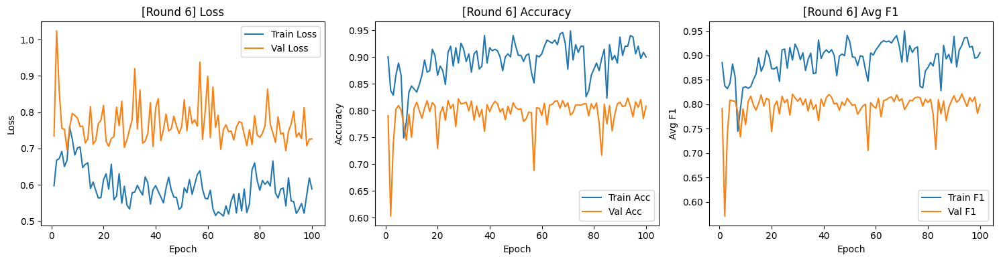


[AL Round 7/20] — Labeled samples: 360
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5000 | Acc: 0.9333 | Avg F1: 0.9386
Val   — Loss: 0.7670 | Acc: 0.7975 | Avg F1: 0.7962


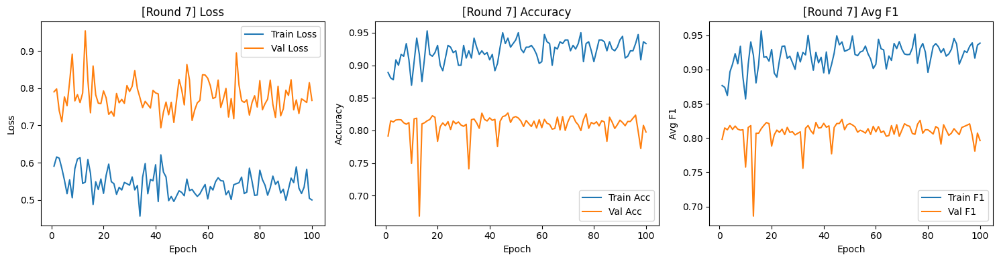


[AL Round 8/20] — Labeled samples: 370
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5002 | Acc: 0.9378 | Avg F1: 0.9370
Val   — Loss: 0.7257 | Acc: 0.8177 | Avg F1: 0.8158


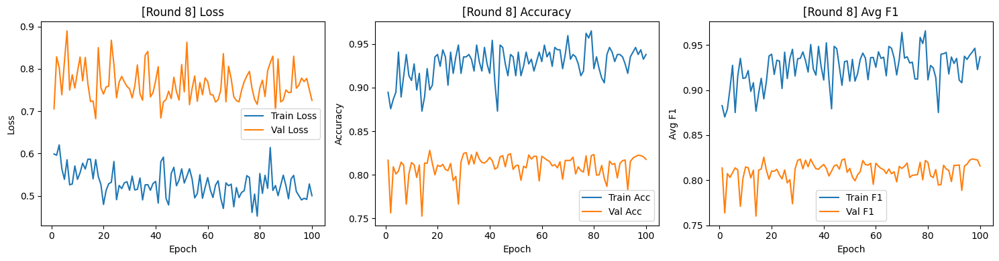


[AL Round 9/20] — Labeled samples: 380
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Clas


Epoch 100/100
Train — Loss: 0.5374 | Acc: 0.9342 | Avg F1: 0.9309
Val   — Loss: 0.7954 | Acc: 0.8285 | Avg F1: 0.8286


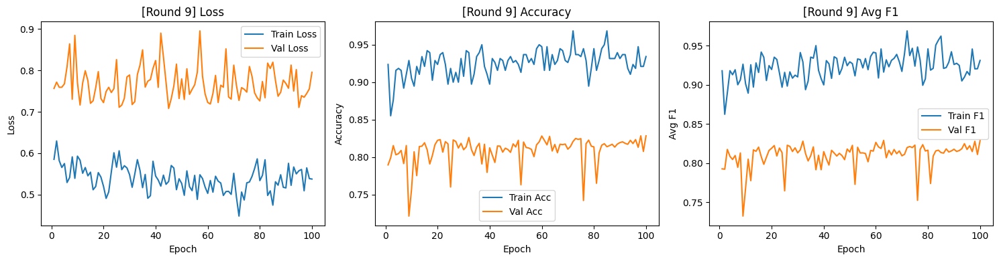


[AL Round 10/20] — Labeled samples: 390
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5338 | Acc: 0.9436 | Avg F1: 0.9481
Val   — Loss: 0.7231 | Acc: 0.8253 | Avg F1: 0.8255


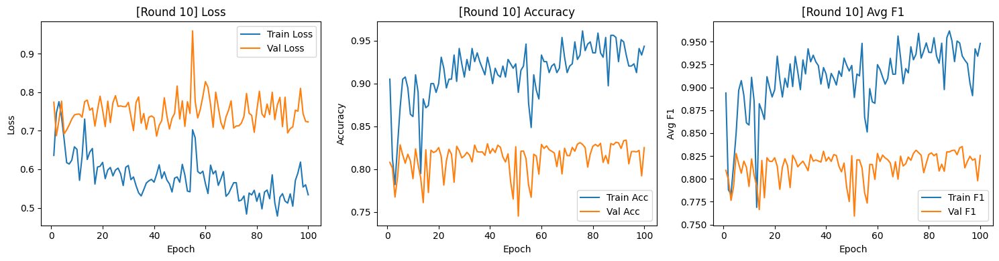


[AL Round 11/20] — Labeled samples: 400
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5327 | Acc: 0.9400 | Avg F1: 0.9390
Val   — Loss: 0.6980 | Acc: 0.8220 | Avg F1: 0.8248


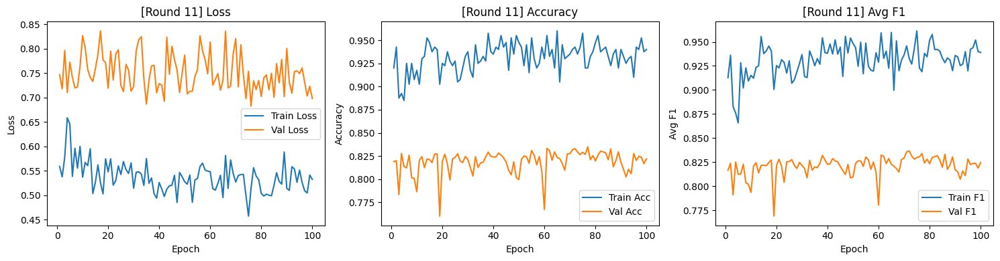


[AL Round 12/20] — Labeled samples: 410
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5961 | Acc: 0.9195 | Avg F1: 0.9116
Val   — Loss: 0.7306 | Acc: 0.8255 | Avg F1: 0.8285


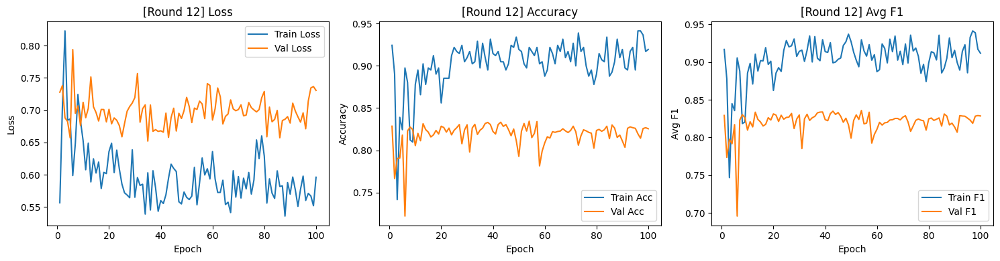


[AL Round 13/20] — Labeled samples: 420
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5279 | Acc: 0.9429 | Avg F1: 0.9407
Val   — Loss: 0.7117 | Acc: 0.8320 | Avg F1: 0.8350


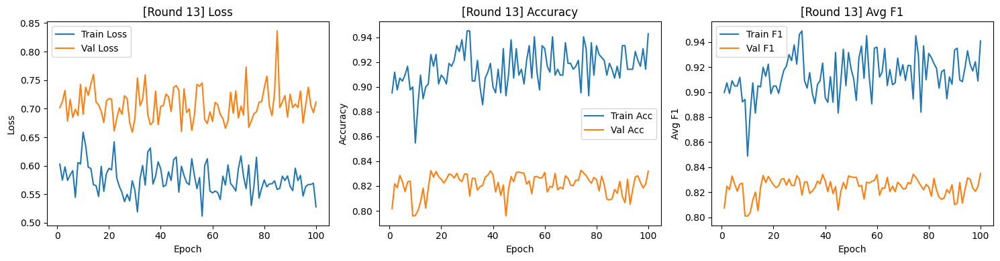


[AL Round 14/20] — Labeled samples: 430
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5654 | Acc: 0.9163 | Avg F1: 0.9134
Val   — Loss: 0.7061 | Acc: 0.8030 | Avg F1: 0.8073


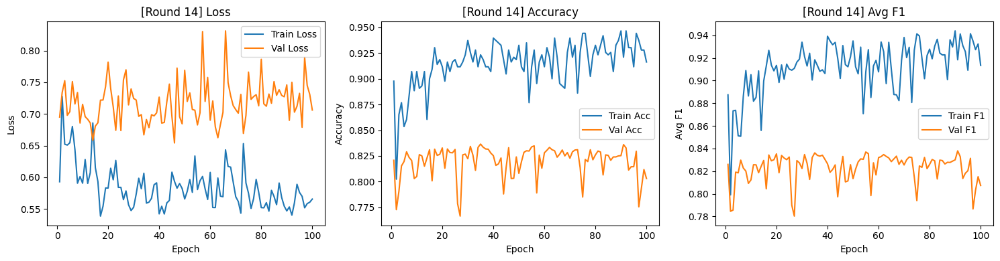


[AL Round 15/20] — Labeled samples: 440
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5115 | Acc: 0.9500 | Avg F1: 0.9493
Val   — Loss: 0.7465 | Acc: 0.8305 | Avg F1: 0.8271


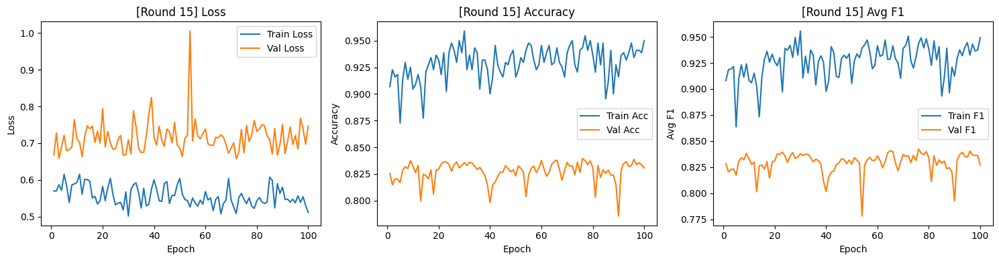


[AL Round 16/20] — Labeled samples: 450
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5283 | Acc: 0.9289 | Avg F1: 0.9305
Val   — Loss: 0.7668 | Acc: 0.8333 | Avg F1: 0.8355


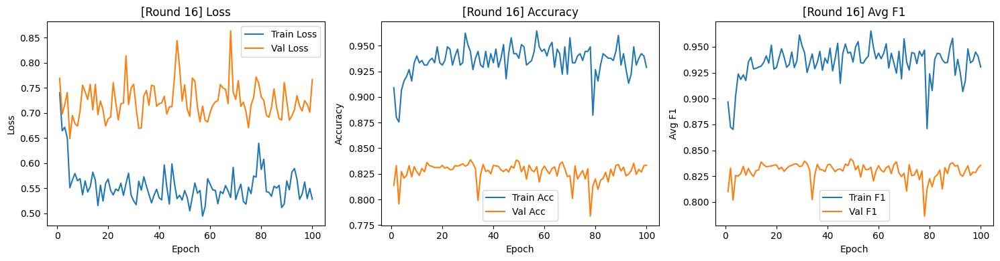


[AL Round 17/20] — Labeled samples: 460
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5260 | Acc: 0.9500 | Avg F1: 0.9502
Val   — Loss: 0.6903 | Acc: 0.8287 | Avg F1: 0.8329


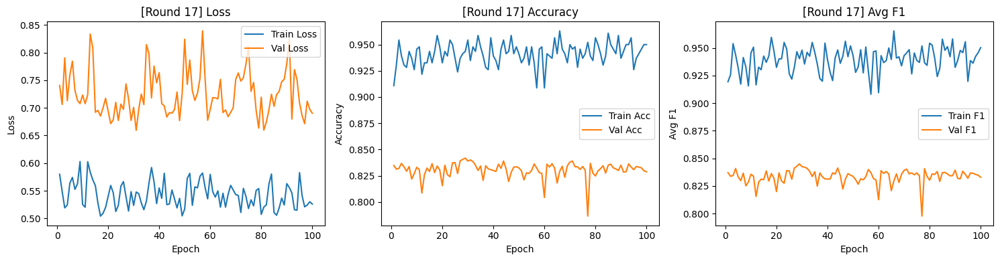


[AL Round 18/20] — Labeled samples: 470
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5708 | Acc: 0.9213 | Avg F1: 0.9191
Val   — Loss: 0.6976 | Acc: 0.8250 | Avg F1: 0.8313


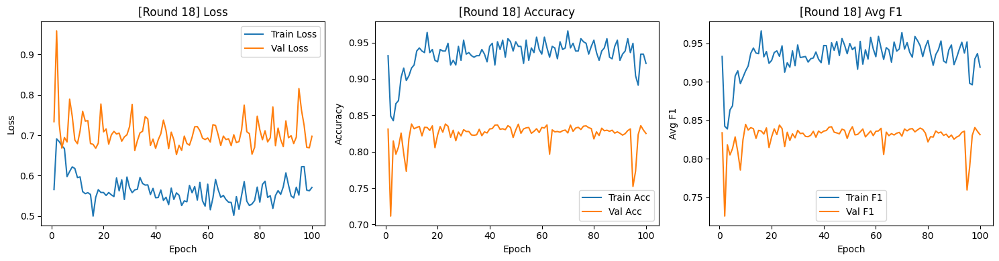


[AL Round 19/20] — Labeled samples: 480
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5576 | Acc: 0.9458 | Avg F1: 0.9496
Val   — Loss: 0.6757 | Acc: 0.8313 | Avg F1: 0.8345


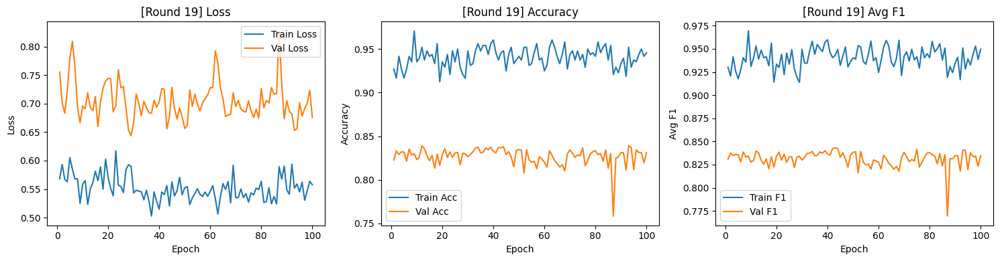


[AL Round 20/20] — Labeled samples: 490
Distribution in Batch 0:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 2 (10.0%)
  Class 1: 4 (20.0%)
  Class 2: 14 (70.0%)
Distribution in Batch 2:
  Class 0: 10 (50.0%)
  Class 1: 1 (5.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 3:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 11 (55.0%)
  Class 1: 2 (10.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 6:
  Class 0: 12 (60.0%)
  Class 1: 1 (5.0%)
  Class 2: 7 (35.0%)
Distribution in Batch 7:
  Class 0: 7 (35.0%)
  Class 1: 2 (10.0%)
  Class 2: 11 (55.0%)
Distribution in Batch 8:
  Class 0: 8 (40.0%)
  Class 1: 6 (30.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 9:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 10:
  Class 0: 10 (50.0%)
  Class 1: 3 (15.0%)
  Cla


Epoch 100/100
Train — Loss: 0.5441 | Acc: 0.9327 | Avg F1: 0.9304
Val   — Loss: 0.7153 | Acc: 0.8340 | Avg F1: 0.8376


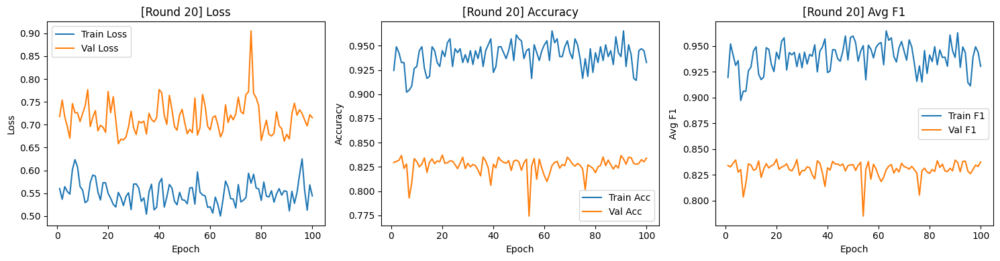

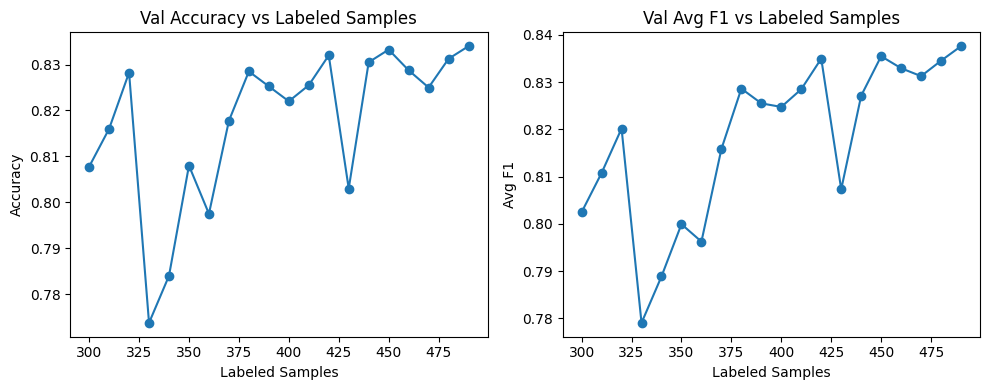

X_labeled shape: (500, 6, 28)
y_labeled shape: (500,)
Distribution in X_labeled:
  Class 0: 227 (45.4%)
  Class 1: 65 (13.0%)
  Class 2: 208 (41.6%)
X_unlabeled shape: (15500, 6, 28)
y_unlabeled shape: (15500,)
Distribution in X_unlabeled:
  Class 0: 7038 (45.4%)
  Class 1: 2017 (13.0%)
  Class 2: 6445 (41.6%)

=== Running strategy: MARGIN ===

[AL Round 1/20] — Labeled samples: 500
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution i


Epoch 100/100
Train — Loss: 0.7124 | Acc: 0.7200 | Avg F1: 0.7043
Val   — Loss: 0.9491 | Acc: 0.6873 | Avg F1: 0.6889


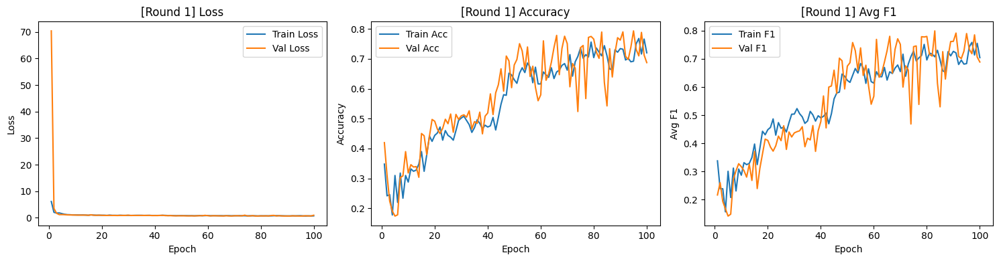


[AL Round 2/20] — Labeled samples: 510
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5841 | Acc: 0.8294 | Avg F1: 0.8033
Val   — Loss: 0.6705 | Acc: 0.7837 | Avg F1: 0.7670


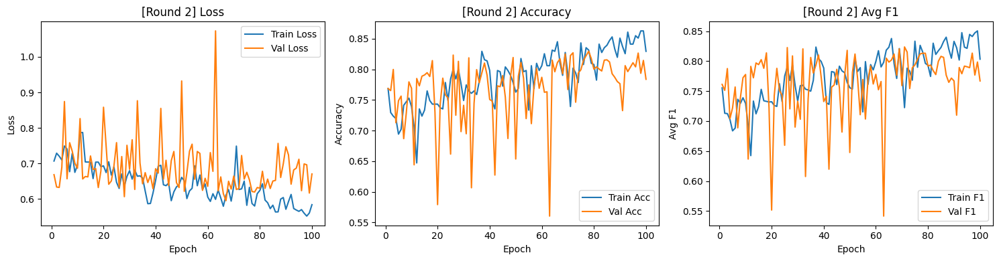


[AL Round 3/20] — Labeled samples: 520
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5673 | Acc: 0.8558 | Avg F1: 0.8309
Val   — Loss: 0.6927 | Acc: 0.7605 | Avg F1: 0.7402


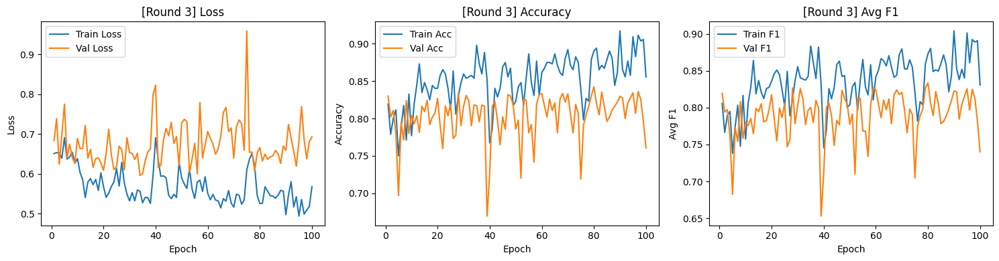


[AL Round 4/20] — Labeled samples: 530
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4996 | Acc: 0.8943 | Avg F1: 0.8724
Val   — Loss: 0.7393 | Acc: 0.8400 | Avg F1: 0.8353


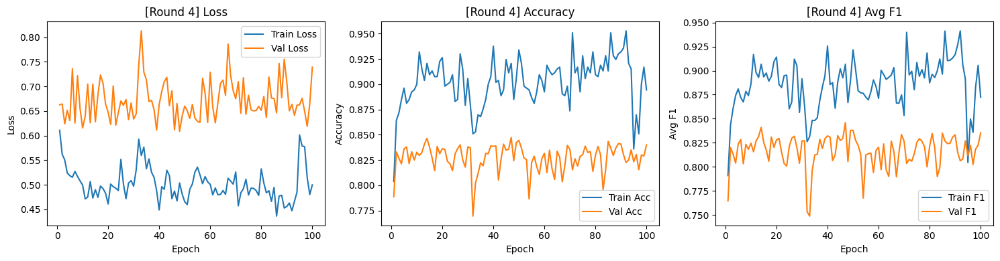


[AL Round 5/20] — Labeled samples: 540
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4805 | Acc: 0.9148 | Avg F1: 0.8947
Val   — Loss: 0.6764 | Acc: 0.8327 | Avg F1: 0.8182


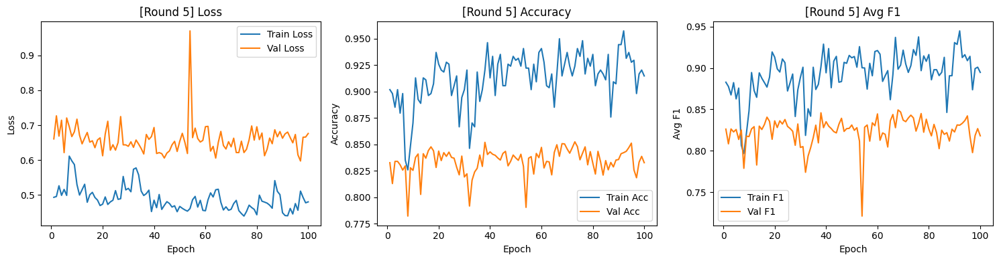


[AL Round 6/20] — Labeled samples: 550
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4526 | Acc: 0.9291 | Avg F1: 0.9084
Val   — Loss: 0.6499 | Acc: 0.8315 | Avg F1: 0.8154


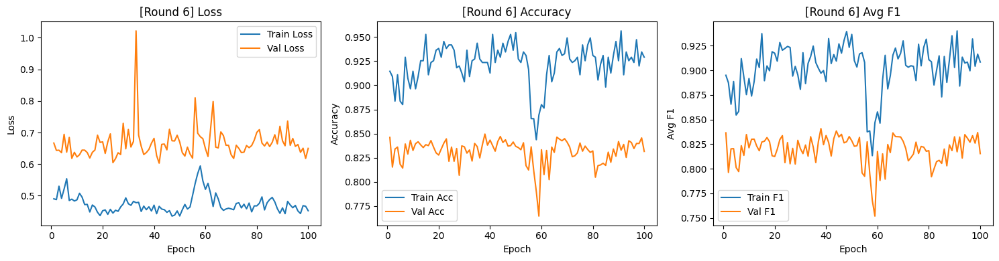


[AL Round 7/20] — Labeled samples: 560
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4162 | Acc: 0.9696 | Avg F1: 0.9615
Val   — Loss: 0.6620 | Acc: 0.8365 | Avg F1: 0.8287


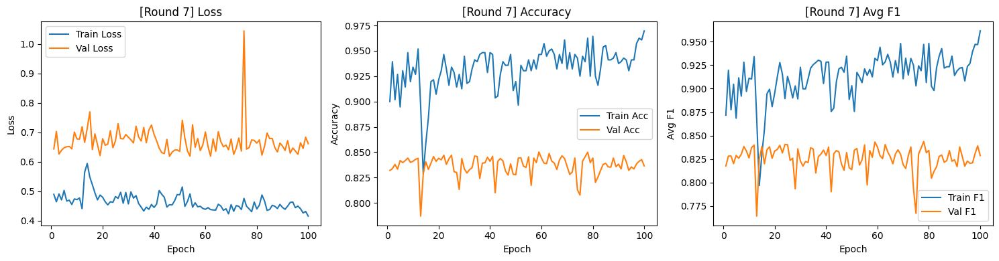


[AL Round 8/20] — Labeled samples: 570
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4673 | Acc: 0.9316 | Avg F1: 0.9078
Val   — Loss: 0.6377 | Acc: 0.8307 | Avg F1: 0.8230


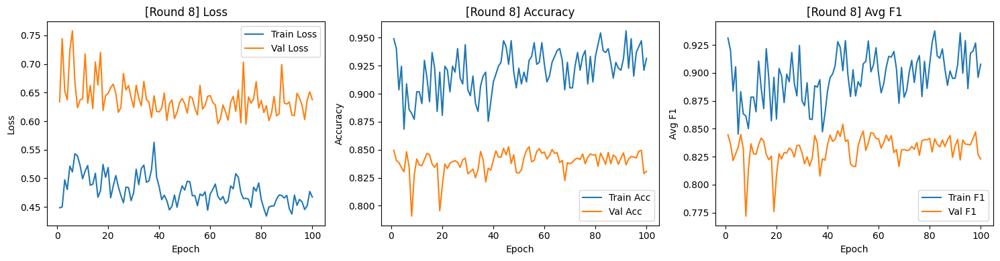


[AL Round 9/20] — Labeled samples: 580
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4522 | Acc: 0.9362 | Avg F1: 0.9092
Val   — Loss: 0.6176 | Acc: 0.8548 | Avg F1: 0.8528


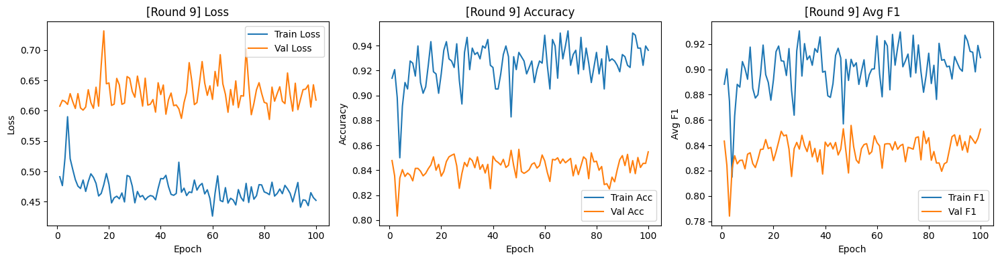


[AL Round 10/20] — Labeled samples: 590
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4885 | Acc: 0.9220 | Avg F1: 0.8939
Val   — Loss: 0.6135 | Acc: 0.8498 | Avg F1: 0.8444


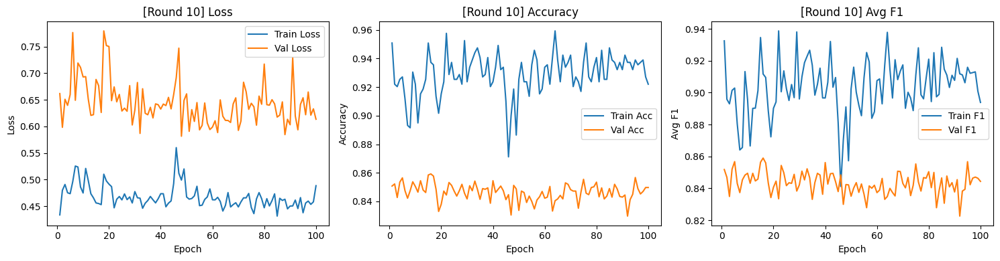


[AL Round 11/20] — Labeled samples: 600
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4388 | Acc: 0.9467 | Avg F1: 0.9224
Val   — Loss: 0.6261 | Acc: 0.8530 | Avg F1: 0.8520


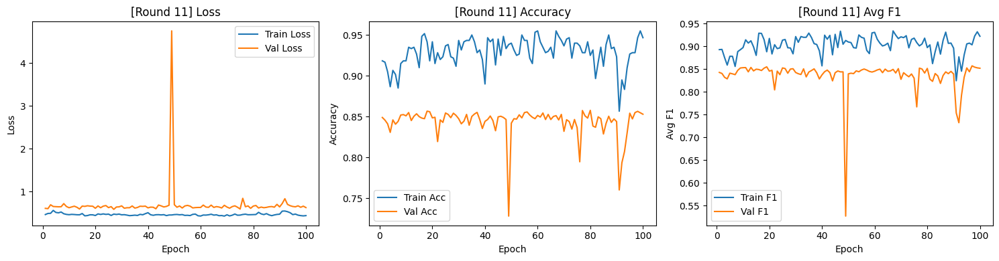


[AL Round 12/20] — Labeled samples: 610
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4397 | Acc: 0.9328 | Avg F1: 0.9080
Val   — Loss: 0.5798 | Acc: 0.8482 | Avg F1: 0.8444


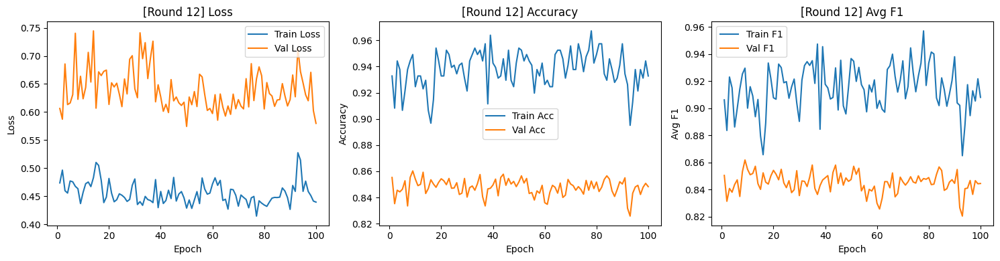


[AL Round 13/20] — Labeled samples: 620
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4424 | Acc: 0.9403 | Avg F1: 0.9184
Val   — Loss: 0.6775 | Acc: 0.8540 | Avg F1: 0.8563


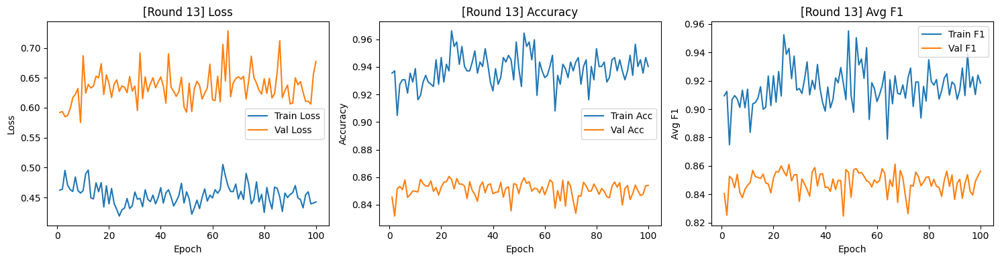


[AL Round 14/20] — Labeled samples: 630
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4605 | Acc: 0.9302 | Avg F1: 0.9013
Val   — Loss: 0.6093 | Acc: 0.8502 | Avg F1: 0.8504


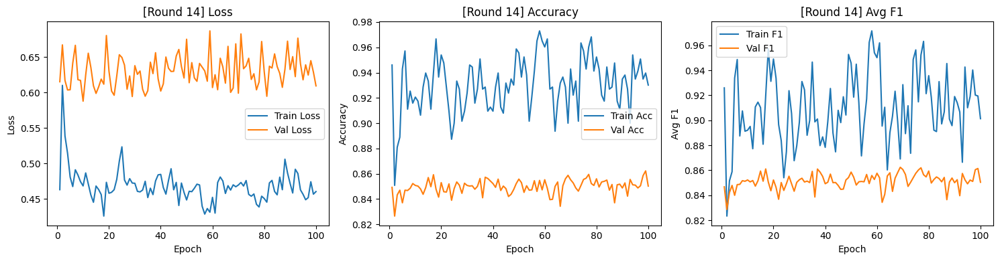


[AL Round 15/20] — Labeled samples: 640
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4546 | Acc: 0.9422 | Avg F1: 0.9309
Val   — Loss: 0.5991 | Acc: 0.8560 | Avg F1: 0.8559


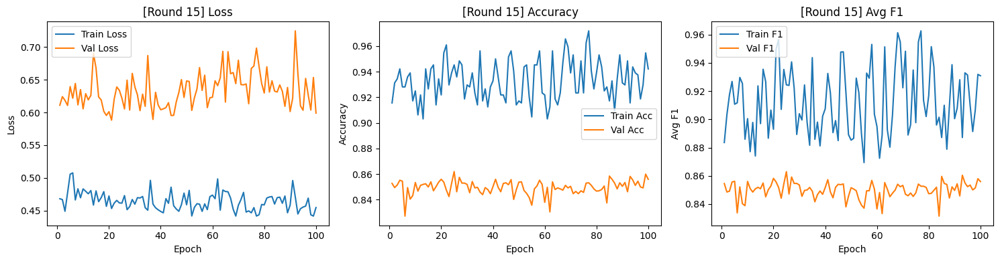


[AL Round 16/20] — Labeled samples: 650
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4715 | Acc: 0.9262 | Avg F1: 0.9015
Val   — Loss: 0.6375 | Acc: 0.8568 | Avg F1: 0.8577


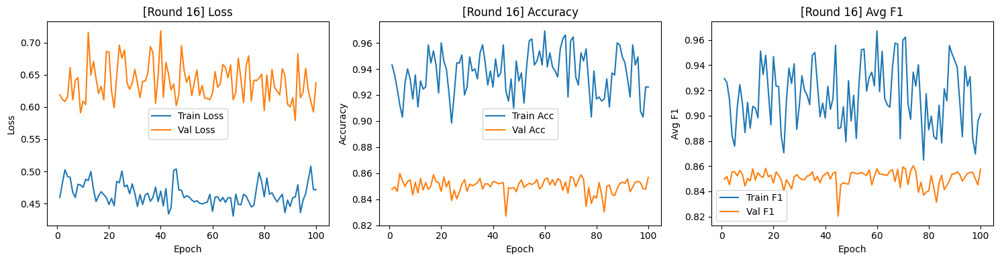


[AL Round 17/20] — Labeled samples: 660
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4816 | Acc: 0.9515 | Avg F1: 0.9455
Val   — Loss: 0.6103 | Acc: 0.8475 | Avg F1: 0.8506


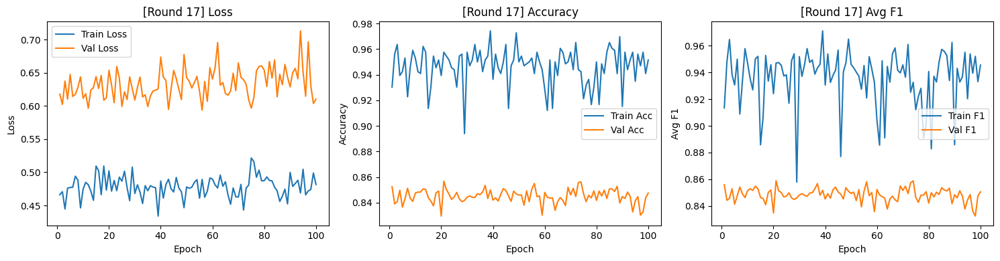


[AL Round 18/20] — Labeled samples: 670
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4719 | Acc: 0.9552 | Avg F1: 0.9503
Val   — Loss: 0.6743 | Acc: 0.8400 | Avg F1: 0.8465


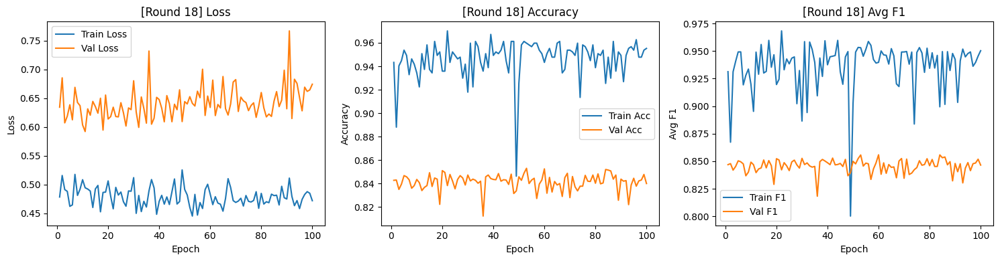


[AL Round 19/20] — Labeled samples: 680
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4800 | Acc: 0.9485 | Avg F1: 0.9441
Val   — Loss: 0.6219 | Acc: 0.8390 | Avg F1: 0.8428


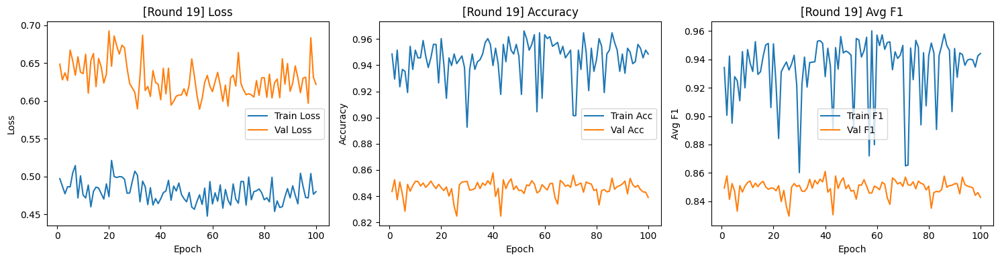


[AL Round 20/20] — Labeled samples: 690
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4918 | Acc: 0.9377 | Avg F1: 0.9293
Val   — Loss: 0.6433 | Acc: 0.8512 | Avg F1: 0.8559


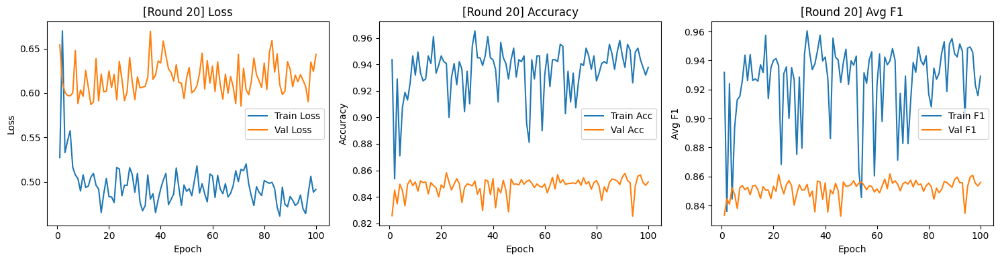

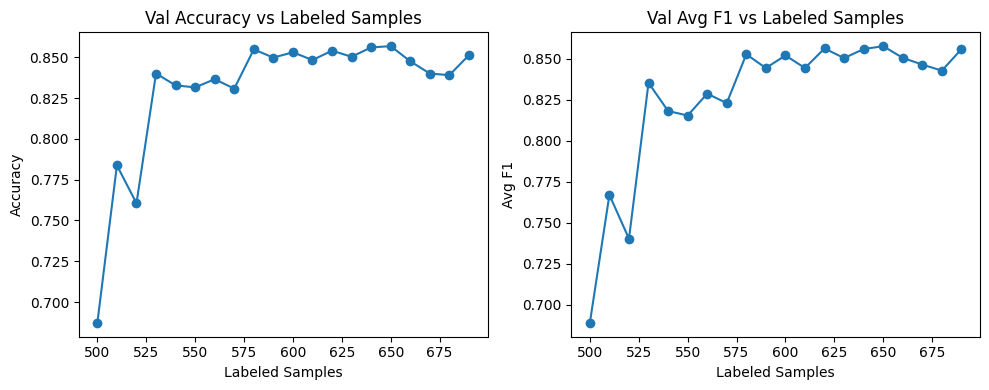


=== Running strategy: LEAST_CONFIDENT ===

[AL Round 1/20] — Labeled samples: 500
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Cl


Epoch 100/100
Train — Loss: 0.7040 | Acc: 0.7340 | Avg F1: 0.7209
Val   — Loss: 0.6653 | Acc: 0.8030 | Avg F1: 0.8089


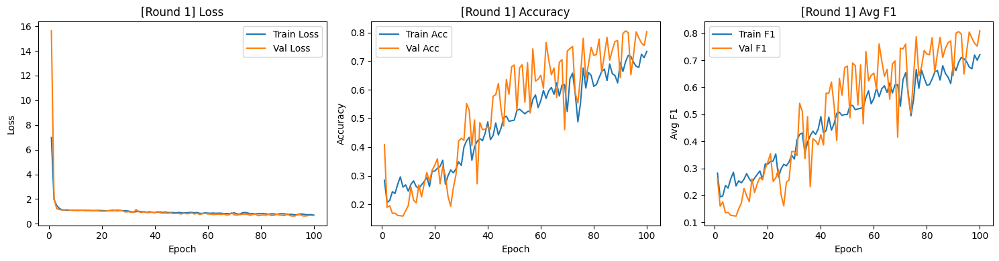


[AL Round 2/20] — Labeled samples: 510
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.6825 | Acc: 0.7941 | Avg F1: 0.7993
Val   — Loss: 0.6154 | Acc: 0.8153 | Avg F1: 0.8235


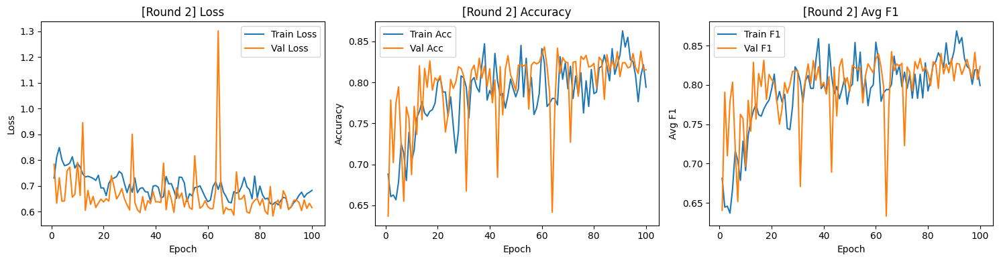


[AL Round 3/20] — Labeled samples: 520
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.6289 | Acc: 0.8404 | Avg F1: 0.8474
Val   — Loss: 0.6287 | Acc: 0.8363 | Avg F1: 0.8335


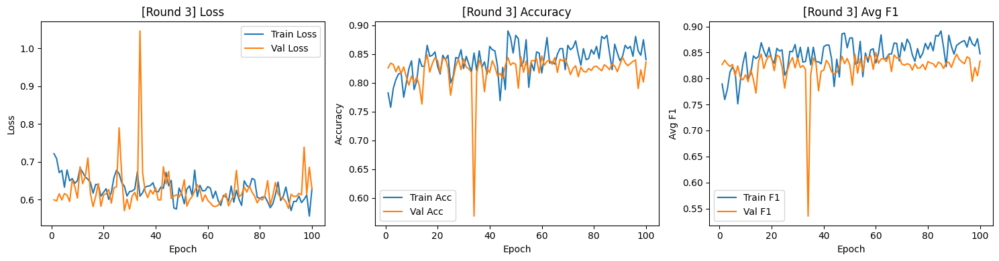


[AL Round 4/20] — Labeled samples: 530
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5322 | Acc: 0.9189 | Avg F1: 0.9267
Val   — Loss: 0.5769 | Acc: 0.8475 | Avg F1: 0.8489


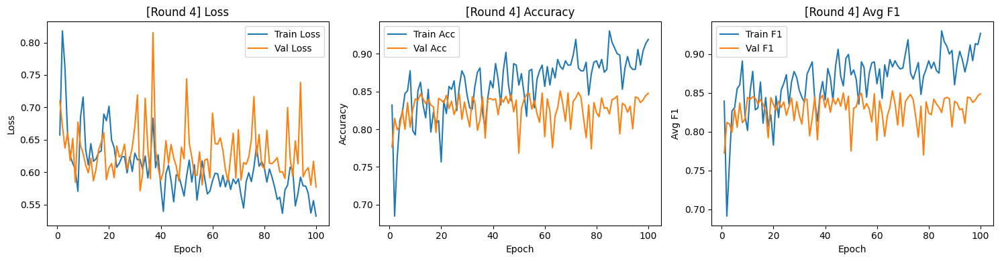


[AL Round 5/20] — Labeled samples: 540
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5079 | Acc: 0.8944 | Avg F1: 0.8734
Val   — Loss: 0.6124 | Acc: 0.8320 | Avg F1: 0.8359


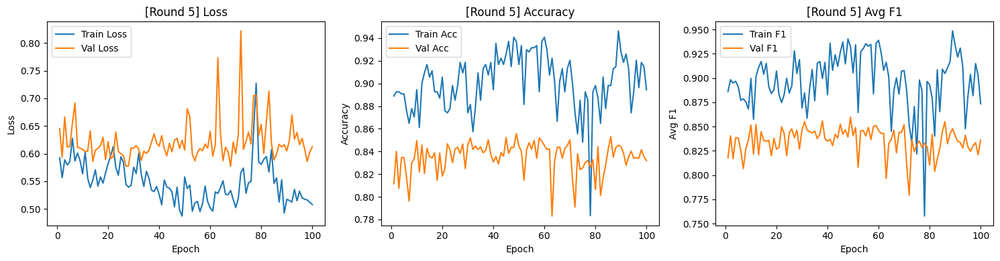


[AL Round 6/20] — Labeled samples: 550
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5107 | Acc: 0.9073 | Avg F1: 0.8998
Val   — Loss: 0.5987 | Acc: 0.8460 | Avg F1: 0.8475


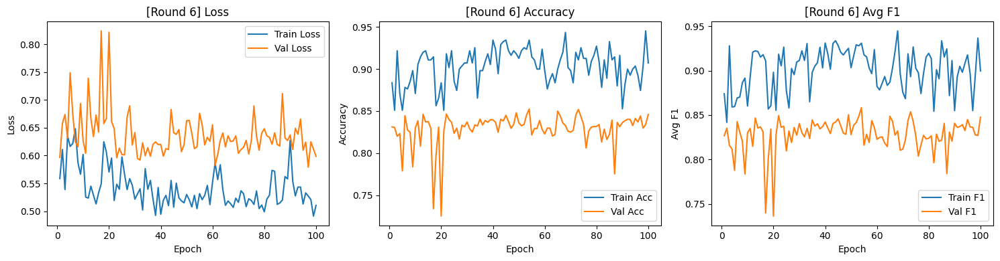


[AL Round 7/20] — Labeled samples: 560
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4929 | Acc: 0.9393 | Avg F1: 0.9376
Val   — Loss: 0.6199 | Acc: 0.8273 | Avg F1: 0.8226


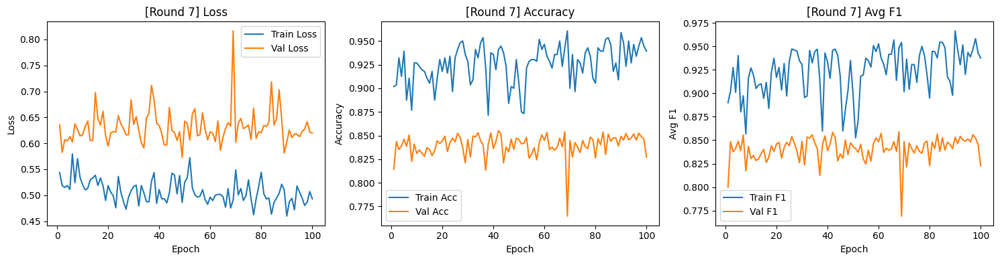


[AL Round 8/20] — Labeled samples: 570
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.4918 | Acc: 0.9351 | Avg F1: 0.9411
Val   — Loss: 0.6096 | Acc: 0.8530 | Avg F1: 0.8532


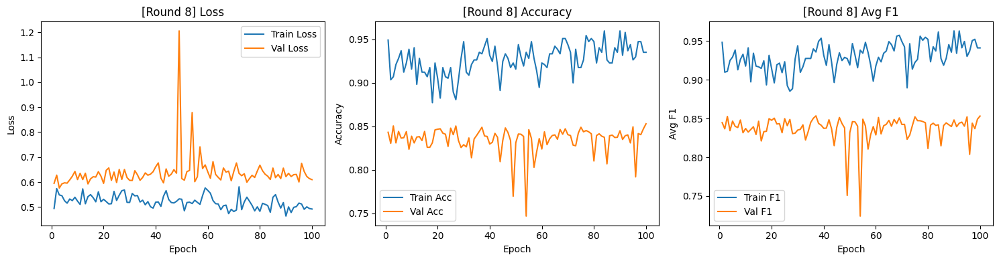


[AL Round 9/20] — Labeled samples: 580
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Distr


Epoch 100/100
Train — Loss: 0.5231 | Acc: 0.9379 | Avg F1: 0.9366
Val   — Loss: 0.6337 | Acc: 0.8305 | Avg F1: 0.8326


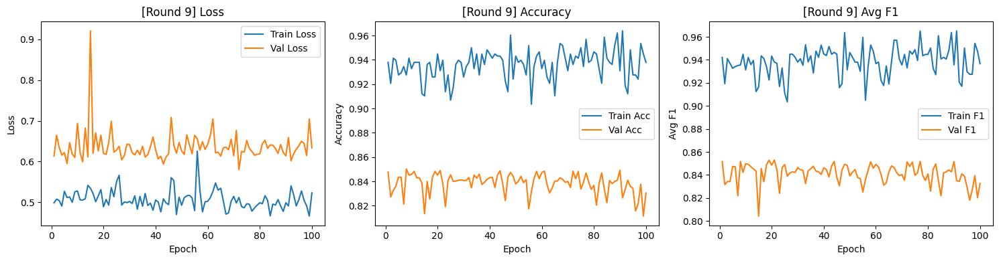


[AL Round 10/20] — Labeled samples: 590
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5759 | Acc: 0.9136 | Avg F1: 0.9106
Val   — Loss: 0.6483 | Acc: 0.8310 | Avg F1: 0.8359


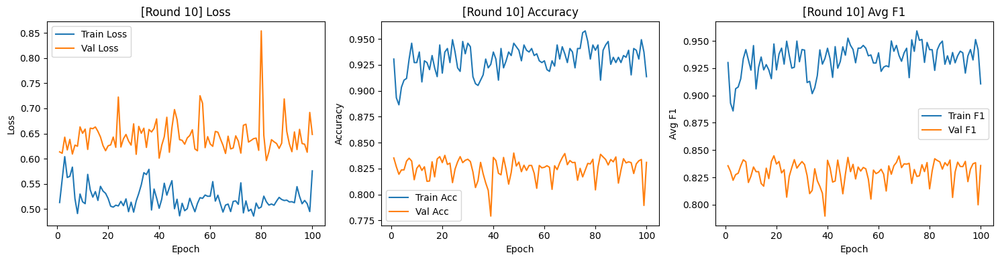


[AL Round 11/20] — Labeled samples: 600
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5245 | Acc: 0.9367 | Avg F1: 0.9340
Val   — Loss: 0.6539 | Acc: 0.8257 | Avg F1: 0.8285


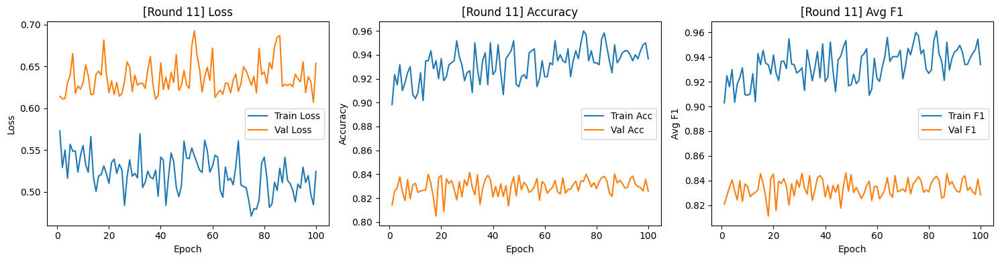


[AL Round 12/20] — Labeled samples: 610
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.4922 | Acc: 0.9459 | Avg F1: 0.9466
Val   — Loss: 0.6263 | Acc: 0.8260 | Avg F1: 0.8334


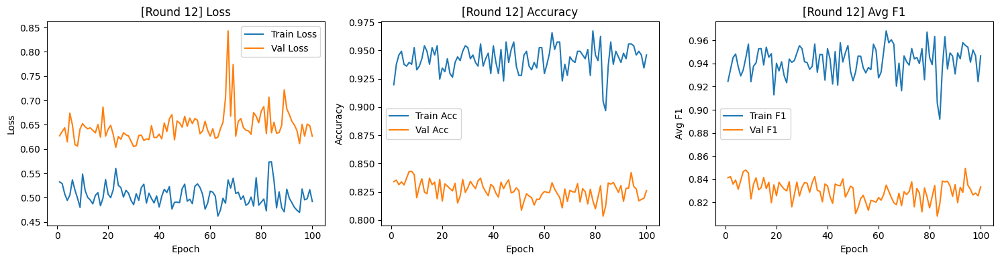


[AL Round 13/20] — Labeled samples: 620
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5423 | Acc: 0.9226 | Avg F1: 0.9150
Val   — Loss: 0.6302 | Acc: 0.8267 | Avg F1: 0.8327


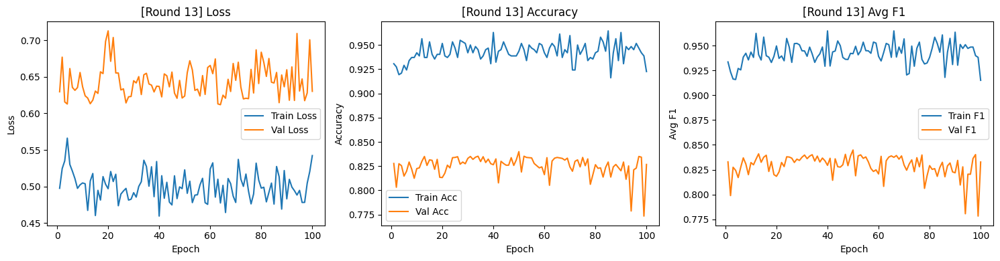


[AL Round 14/20] — Labeled samples: 630
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5109 | Acc: 0.9444 | Avg F1: 0.9466
Val   — Loss: 0.6465 | Acc: 0.8240 | Avg F1: 0.8234


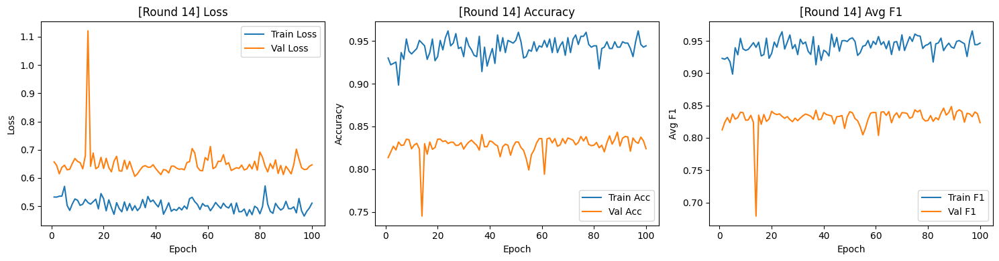


[AL Round 15/20] — Labeled samples: 640
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5024 | Acc: 0.9328 | Avg F1: 0.9301
Val   — Loss: 0.6996 | Acc: 0.8363 | Avg F1: 0.8381


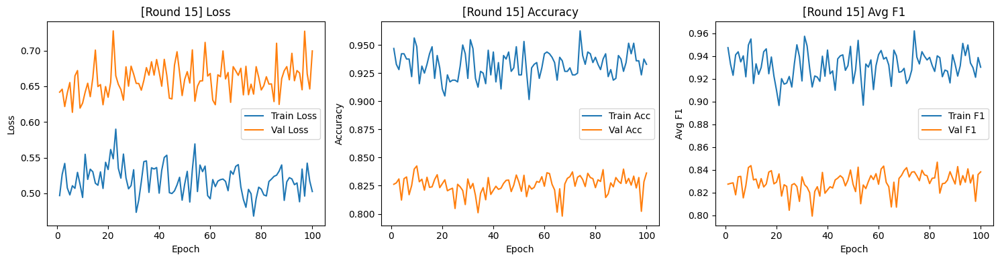


[AL Round 16/20] — Labeled samples: 650
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5307 | Acc: 0.9262 | Avg F1: 0.9240
Val   — Loss: 0.6381 | Acc: 0.8203 | Avg F1: 0.8235


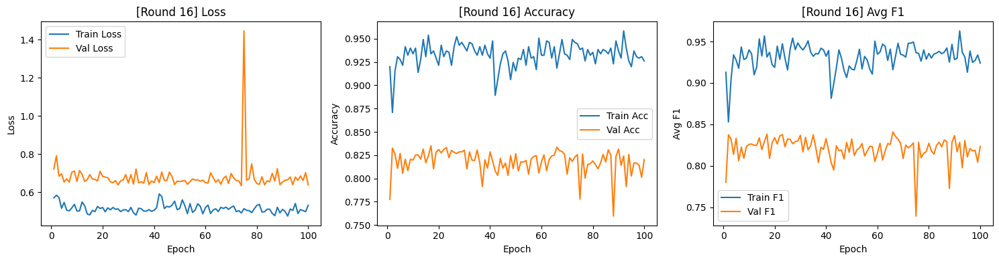


[AL Round 17/20] — Labeled samples: 660
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5019 | Acc: 0.9455 | Avg F1: 0.9440
Val   — Loss: 0.6554 | Acc: 0.8295 | Avg F1: 0.8365


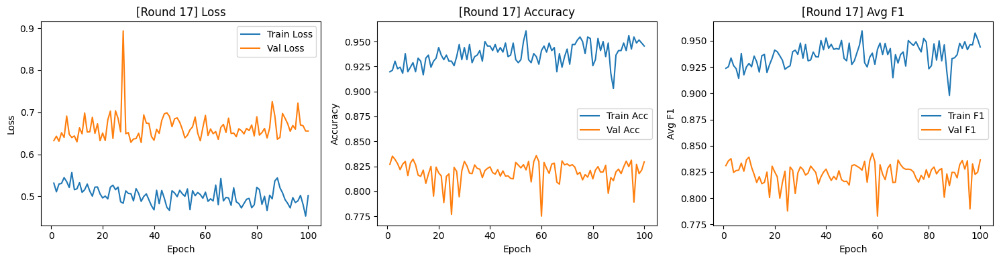


[AL Round 18/20] — Labeled samples: 670
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5121 | Acc: 0.9358 | Avg F1: 0.9343
Val   — Loss: 0.7695 | Acc: 0.8190 | Avg F1: 0.8159


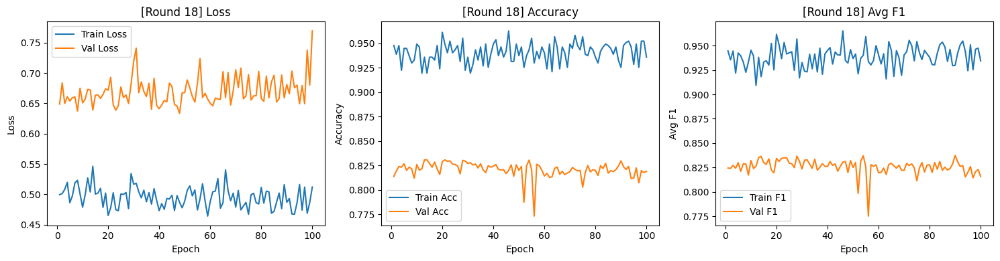


[AL Round 19/20] — Labeled samples: 680
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5413 | Acc: 0.9250 | Avg F1: 0.9225
Val   — Loss: 0.7000 | Acc: 0.8207 | Avg F1: 0.8240


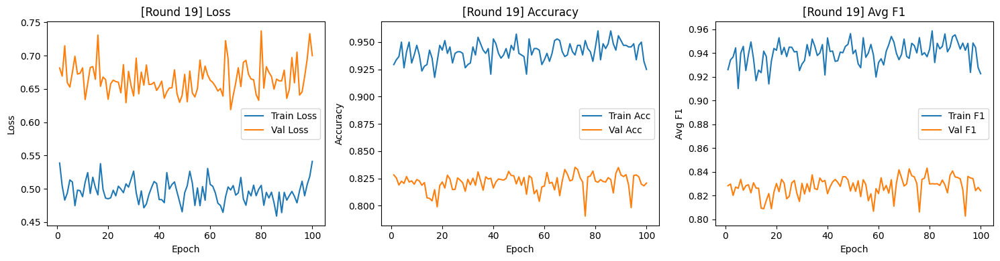


[AL Round 20/20] — Labeled samples: 690
Distribution in Batch 0:
  Class 0: 11 (55.0%)
  Class 1: 1 (5.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 1:
  Class 0: 9 (45.0%)
  Class 1: 1 (5.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 2:
  Class 0: 12 (60.0%)
  Class 1: 2 (10.0%)
  Class 2: 6 (30.0%)
Distribution in Batch 3:
  Class 0: 10 (50.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 4:
  Class 0: 8 (40.0%)
  Class 1: 2 (10.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 5:
  Class 0: 5 (25.0%)
  Class 1: 5 (25.0%)
  Class 2: 10 (50.0%)
Distribution in Batch 6:
  Class 0: 8 (40.0%)
  Class 1: 3 (15.0%)
  Class 2: 9 (45.0%)
Distribution in Batch 7:
  Class 0: 9 (45.0%)
  Class 1: 3 (15.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 8:
  Class 0: 6 (30.0%)
  Class 1: 2 (10.0%)
  Class 2: 12 (60.0%)
Distribution in Batch 9:
  Class 0: 10 (50.0%)
  Class 1: 2 (10.0%)
  Class 2: 8 (40.0%)
Distribution in Batch 10:
  Class 0: 9 (45.0%)
  Class 1: 2 (10.0%)
  Class 2: 9 (45.0%)
Dist


Epoch 100/100
Train — Loss: 0.5246 | Acc: 0.9406 | Avg F1: 0.9390
Val   — Loss: 0.6180 | Acc: 0.8283 | Avg F1: 0.8306


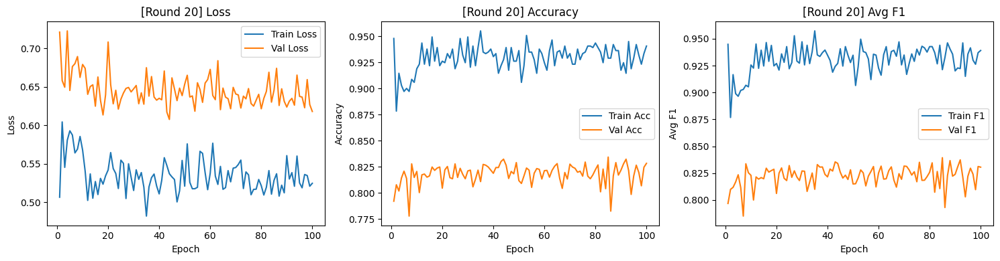

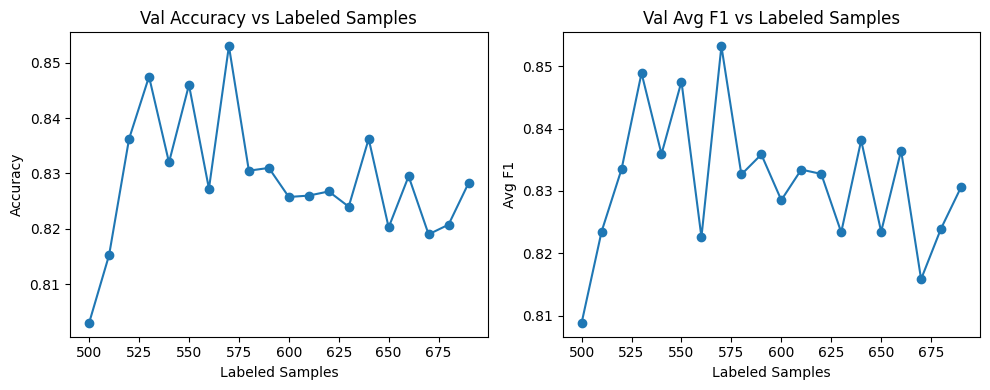

In [18]:
all_histories = {}

for initial_labeled, iters,query_size in data:
    initial_labeled= 1-initial_labeled/len(X_pool)
    X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_pool, y_pool, test_size=initial_labeled, stratify=y_pool, random_state=42)
    print(f"X_labeled shape: {X_labeled.shape}")
    print(f"y_labeled shape: {y_labeled.shape}")
    print_distribution(y_labeled, name="X_labeled")
    print(f"X_unlabeled shape: {X_unlabeled.shape}")
    print(f"y_unlabeled shape: {y_unlabeled.shape}")
    print_distribution(y_unlabeled, name="X_unlabeled")

    
    
    labeled_dataset = Dataset(X_labeled, y_labeled)
    unlabeled_dataset = Dataset(X_unlabeled, y_unlabeled)
    val_dataset = Dataset(X_val, y_val)

    
    
    for strat in strategies:
        print(f"\n=== Running strategy: {strat.upper()} ===")
        
        # Reset datasets to initial versions (deepcopy to avoid mutations)
        labeled = copy.deepcopy(labeled_dataset)
        unlabeled = copy.deepcopy(unlabeled_dataset)
    
        model.load_state_dict(copy.deepcopy(initial_state_dict))
        
        hist = active_learning_loop(
            model,
            labeled_dataset=labeled,
            unlabeled_dataset=unlabeled,
            val_dataset=val_dataset,
            strategy=strat,
            device=device,
            iters=iters,
            query_size=query_size,
            final_epochs=epochs,
            loss_mode=loss_mode,
            batch_size=batch_size
        )
        
        all_histories[(strat, initial_labeled, iters, query_size)] = hist


with open("/kaggle/working/history_entropy.pkl", "wb") as f:
    pickle.dump(all_histories, f)

# Plotting final result

In [19]:
#figuring out different data sizes

def eff_total_labeled_samples(init, iterations, query):
    return round(iterations * init + query * (iterations * (iterations - 1)) // 2)

def total_labeled_samples(init, iterations, query):
    return init+query*iterations

def best_cumsum(available):
    best = (0, 0, 0, 0)  # (cumsum, init, step, n)
    for init in range(1, available + 1):
        for step in range(1, available + 1):
            # max possible n for this init and step
            max_n = (available - init) // step
            for n in range(1, max_n + 1):
                total = init + n * step
                if total <= available:
                    cumsum = n * init + step * n * (n - 1) // 2
                    if cumsum > best[0]:
                        best = (cumsum, init, step, n)
    return best

available = 100
cumsum, init, step, n = best_cumsum(available)
print(f"Max cumsum = {cumsum} with init={init}, step={step}, n={n}")


example = [ (30,20,1), (60,40,1),(120,40,2),(120,80,1),(180,40,3),(300,40,5) ]

for init,iterations,query in example:
    print(f'Init: {init}, Iters: {iterations}, Query: {query}, Total: {total_labeled_samples(init, iterations, query)}, Effective: {eff_total_labeled_samples(init, iterations, query)}')

Max cumsum = 4950 with init=1, step=1, n=99
Init: 30, Iters: 20, Query: 1, Total: 50, Effective: 790
Init: 60, Iters: 40, Query: 1, Total: 100, Effective: 3180
Init: 120, Iters: 40, Query: 2, Total: 200, Effective: 6360
Init: 120, Iters: 80, Query: 1, Total: 200, Effective: 12760
Init: 180, Iters: 40, Query: 3, Total: 300, Effective: 9540
Init: 300, Iters: 40, Query: 5, Total: 500, Effective: 15900


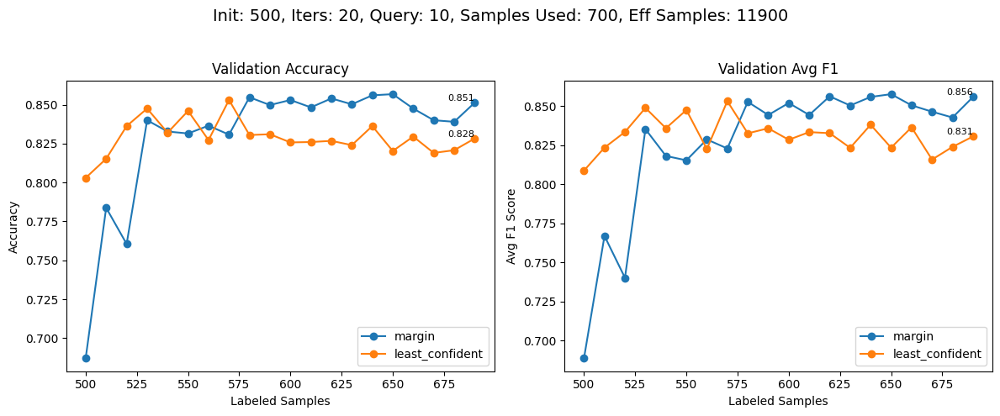

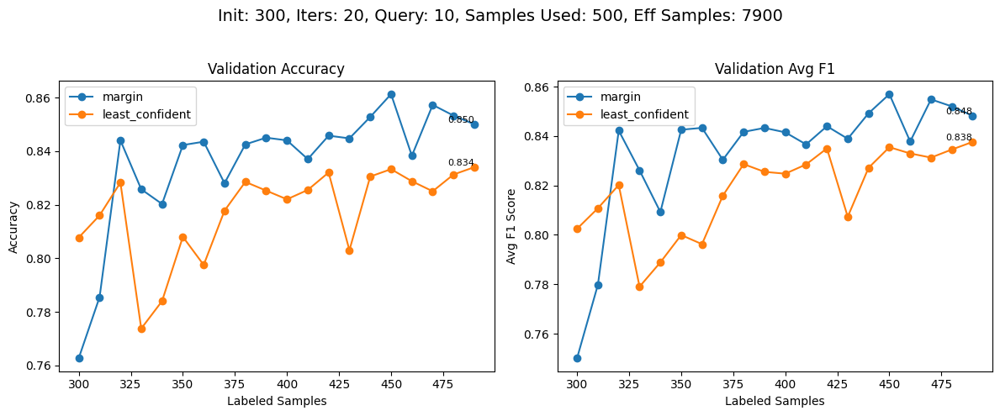

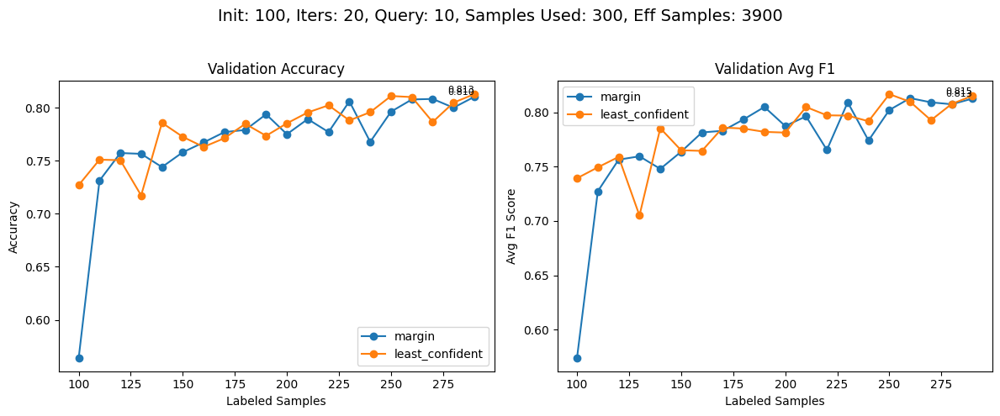

In [20]:
def eff_total_labeled_samples(init, iterations, query):
    return round(iterations * init + query * (iterations * (iterations - 1)) // 2)

def total_labeled_samples(init, iterations, query):
    return init+query*iterations

unique_configs = sorted(set((init_size, iters, query) for (_, init_size, iters, query) in all_histories.keys()))

for init_size, iters, query in unique_configs:
    plt.figure(figsize=(12, 5))
    plt.suptitle(f"Init: {round(len(X_pool)*(1-init_size))}, Iters: {iters}, Query: {query}, Samples Used: {total_labeled_samples(round(len(X_pool)*(1-init_size)), iters, query)}, Eff Samples: {eff_total_labeled_samples(round(len(X_pool)*(1-init_size)), iters, query)}", fontsize=14)
    # Accuracy
    plt.subplot(1, 2, 1)
    for (strat, size, iters_, query_), hist in all_histories.items():
        if (size, iters_, query_) == (init_size, iters, query):
            plt.plot(hist["samples"], hist["round_val_acc"], label=strat, marker='o')
            # Show final accuracy value
            x_final = hist["samples"][-1]
            y_final = hist["round_val_acc"][-1]
            plt.text(x_final, y_final, f"{y_final:.3f}", fontsize=8, ha='right', va='bottom')
    plt.title("Validation Accuracy")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Accuracy")
    plt.legend()

    # F1 Score
    plt.subplot(1, 2, 2)
    for (strat, size, iters_, query_), hist in all_histories.items():
        if (size, iters_, query_) == (init_size, iters, query):
            plt.plot(hist["samples"], hist["round_val_avg_f1"], label=strat, marker='o')
            # Show final F1 value
            x_final = hist["samples"][-1]
            y_final = hist["round_val_avg_f1"][-1]
            plt.text(x_final, y_final, f"{y_final:.3f}", fontsize=8, ha='right', va='bottom')
    plt.title("Validation Avg F1")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Avg F1 Score")
    plt.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [21]:
# Create export directory
export_dir = "active_learning_results"
os.makedirs(export_dir, exist_ok=True)

# Combined CSV file
all_csv_path = os.path.join(export_dir, "all_results.csv")
with open(all_csv_path, mode="w", newline='') as all_csv_file:
    writer_all = csv.writer(all_csv_file)
    writer_all.writerow(["strategy", "init", "iterations", "query", "sample_size", "accuracy", "f1_score"])
    print("strategy,init,iterations,query,sample_size,accuracy,f1_score")  # Header for print

    for init_size, iters, query in unique_configs:
        init_abs = round(len(X_pool) * (1 - init_size))
        filename = f"results_init{init_abs}_iters{iters}_query{query}.csv"
        filepath = os.path.join(export_dir, filename)

        with open(filepath, mode="w", newline='') as f:
            writer = csv.writer(f)
            writer.writerow(["strategy", "init", "iterations", "query", "sample_size", "accuracy", "f1_score"])

            for (strat, size, iters_, query_), hist in all_histories.items():
                if (size, iters_, query_) == (init_size, iters, query):
                    for s, acc, f1 in zip(hist["samples"], hist["round_val_acc"], hist["round_val_avg_f1"]):
                        row = [strat, init_abs, iters, query, s, round(acc, 6), round(f1, 6)]
                        print(",".join(map(str, row)))   # Print CSV-style row
                        writer.writerow(row)
                        writer_all.writerow(row)

print(f"\n✅ All results exported to directory: {export_dir}")


strategy,init,iterations,query,sample_size,accuracy,f1_score
margin,500,20,10,500,0.68725,0.68891
margin,500,20,10,510,0.78375,0.766991
margin,500,20,10,520,0.7605,0.740244
margin,500,20,10,530,0.84,0.835329
margin,500,20,10,540,0.83275,0.81817
margin,500,20,10,550,0.8315,0.815381
margin,500,20,10,560,0.8365,0.828731
margin,500,20,10,570,0.83075,0.822955
margin,500,20,10,580,0.85475,0.852763
margin,500,20,10,590,0.84975,0.844353
margin,500,20,10,600,0.853,0.852042
margin,500,20,10,610,0.84825,0.844377
margin,500,20,10,620,0.854,0.856314
margin,500,20,10,630,0.85025,0.850436
margin,500,20,10,640,0.856,0.855924
margin,500,20,10,650,0.85675,0.8577
margin,500,20,10,660,0.8475,0.850557
margin,500,20,10,670,0.84,0.846483
margin,500,20,10,680,0.839,0.842762
margin,500,20,10,690,0.85125,0.855863
least_confident,500,20,10,500,0.803,0.808853
least_confident,500,20,10,510,0.81525,0.823496
least_confident,500,20,10,520,0.83625,0.833504
least_confident,500,20,10,530,0.8475,0.848908
least_confident,